In [786]:
import xarray as xr
import flox.xarray as fx
import numpy as np
import pandas as pd
import cmocean.cm as cmo
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as ticker
import oceanmixedlayers.oceanmixedlayers as oml
import oceanmixedlayers.threshold as td
import kneed
import matplotlib.path as mpath

In [1122]:
# Set title size
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 18  # Titles larger
# Set axis label size
plt.rcParams['axes.labelsize'] = 14  # Labels slightly smaller

plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14

In [2]:
ds_so = xr.open_dataset('/swot/SUM05/jpope/mld_threshold.nc', chunks = {'N_PROF': 10000})

In [5]:
ds_energy = xr.open_mfdataset('/swot/SUM05/amf2288/mld_energy/*.nc', engine='h5netcdf')
ds_energy = ds_energy.rename({'dim_0': 'N_PROF','__xarray_dataarray_variable__':'MLD'})
ds_energy = ds_energy.assign_coords(N_PROF=("N_PROF", np.arange(ds_energy.dims["N_PROF"])))

In [611]:
ds_final_angle3 = xr.open_dataset('/swot/SUM05/jpope/mld_energy/true_final_ds.nc', chunks = {'N_PROF'})

In [739]:
ds_final_angle3 = ds_final_angle3.assign(MLE_threshold = ('N_PROF', energy_interp.values))

In [737]:
ds_final = ds_final.assign(MLE_threshold = ('N_PROF', energy_interp.values))

In [719]:
ds_energy = ds_energy.assign(isel=("N_PROF", ds_final_angle3['N_PROF'].values)).swap_dims({'N_PROF': 'isel'}).drop_vars('N_PROF').rename({'isel': 'N_PROF'})

In [20]:
def detect_knee_angle(x, y, window=1):
    """
    Detect knee point based on smallest angle between three consecutive points.

    Parameters
    ----------
    x : array-like
        Independent variable (e.g. energy).
    y : array-like
        Dependent variable (e.g. MLD).
    window : int
        How far before and after the center point to look (default: 1 = use i-1, i, i+1).

    Returns
    -------
    knee_idx : int
        Index of the knee point in the original data.
    angles : np.ndarray
        Array of angles (in radians) for each interior point.
    """
    x = np.asarray(x)
    y = np.asarray(y)
    n = len(x)
    angles = np.full(n, np.nan)  # initialize with NaNs

    for i in range(window, n - window):
        # Get three points: A (i-window), B (i), C (i+window)
        A = np.array([x[i - window], y[i - window]])
        B = np.array([x[i], y[i]])
        C = np.array([x[i + window], y[i + window]])

        # Vectors BA and BC
        BA = A - B
        BC = C - B

        # Angle at point B (in radians)
        cos_theta = np.dot(BA, BC) / (np.linalg.norm(BA) * np.linalg.norm(BC))
        # Clamp to [-1, 1] to avoid numerical issues
        cos_theta = np.clip(cos_theta, -1.0, 1.0)
        theta = np.arccos(cos_theta)

        angles[i] = theta

    # Knee is point with smallest angle (sharpest turn)
    knee_idx = np.nanargmin(angles)
    mld = y[knee_idx]
    mle = x[knee_idx]
    return mld, mle

In [512]:
def batch_detect_knee(ds_subset):
    energy = ds_subset.energy.values
    mld_array = ds_subset.MLD.values
    
    n_prof = mld_array.shape[1]
    mlds = np.full(n_prof, np.nan)
    mles = np.full(n_prof, np.nan)
    
    for i in range(n_prof):
        mld_profile = mld_array[:, i]
        if np.any(np.isnan(mld_profile)):
            continue
        try:
            mld, mle = detect_knee_angle(energy, mld_profile, window = 2)
            mlds[i] = mld
            mles[i] = mle
        except Exception:
            continue

    return mlds, mles

In [178]:
# Select profiles with valid data at 1000 dbar
sig0_at_10 = ds_so['SIG0'].sel(PRES_INTERPOLATED=10, method='nearest')
valid_mask = ~np.isnan(sig0_at_10)
valid_indices = np.where(valid_mask.values)[0]

# Filter ds_subset to retain only those profiles
ds_filtered = ds_so.isel(N_PROF=valid_indices)

In [140]:
ds_filtered = ds_filtered.assign_coords(MLD_knee = ("N_PROF", combined_ds.MLD_knee.values),
                  MLE_knee = ("N_PROF", combined_ds.MLE_knee.values),
                         MLD_threshold = ds_filtered.MLD_threshold)

In [162]:
ds_final = ds_filtered

In [ ]:
ds_final = ds_final.reset_coords(['MLD_threshold', 'MLD_knee', 'MLE_knee'], drop=False)

In [ ]:
ds_final.to_netcdf('/swot/SUM05/jpope/mld_energy/true_final_ds.nc')

--------

### Energy of Threshold Method 

In [707]:
def energy_interp_threshold_core(energy, mld, mld_threshold):
    """Interpolate energy at a given MLD threshold for a single profile."""
    if np.all(np.isnan(energy)) or np.all(np.isnan(mld)) or np.isnan(mld_threshold):
        return np.nan
    try:
        return np.interp(mld_threshold, mld, energy)
    except Exception:
        return np.nan

In [708]:
energy_interp = xr.apply_ufunc(
    energy_interp_threshold_core,
    ds_energy['energy'],               # shape: (energy, N_PROF)
    ds_energy['MLD'],                  # shape: (energy, N_PROF)
    ds_final_angle3['MLD_threshold'],  # shape: (N_PROF,)
    input_core_dims=[['energy'], ['energy'], []],
    output_core_dims=[[]],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float],
    dask_gufunc_kwargs={'allow_rechunk': True}
)

/home.ufs/jp4778/.conda/envs/pangeo/lib/python3.10/site-packages/dask/array/gufunc.py:456: PerformanceWarning: Increasing number of chunks by factor of 63
  tmp = blockwise(


In [715]:
energy_interp.values

array([40.22207715, 27.09709766, 72.80571437, ...,  5.44664133,
       10.9219463 ,  3.37488111])

-----

### Seasonal Analysis of MLDs

#### General Functions

In [166]:
def get_ds_binned(ds, lon_bins, lat_bins):
    """
    Bin an xarray Dataset by 3-degree latitude and longitude bins,
    replacing Interval dimensions with bin centers.
    
    Parameters:
        ds : xarray.Dataset
            The dataset to bin.
        lon_bins : array-like
            Bin edges for longitude (e.g. np.arange(-180, 181, 3))
        lat_bins : array-like
            Bin edges for latitude (e.g. np.arange(-90, 91, 3))
    
    Returns:
        xarray.Dataset
            Binned dataset with dimensions (PRES_INTERPOLATED, lon_c, lat_c)
    """

    # Step 1: Bin with fx.xarray_reduce using IntervalIndex
    ds_binned = fx.xarray_reduce(
        ds,
        'LONGITUDE',
        'LATITUDE',
        func='mean',
        expected_groups=(
            pd.IntervalIndex.from_breaks(lon_bins),
            pd.IntervalIndex.from_breaks(lat_bins),
        ),
        fill_value=np.nan,
        skipna=True
    )

    # Step 2: Create left, right, center arrays
    lon_l = np.array(lon_bins[:-1])
    lon_r = np.array(lon_bins[1:])
    lon_c = (lon_l + lon_r) / 2

    lat_l = np.array(lat_bins[:-1])
    lat_r = np.array(lat_bins[1:])
    lat_c = (lat_l + lat_r) / 2

    # Step 3: Replace Interval dims with center dims
    ds_binned = ds_binned.assign_coords({
        "lon_c": ("LONGITUDE", [iv.mid for iv in ds_binned['LONGITUDE'].values]),
        "lat_c": ("LATITUDE", [iv.mid for iv in ds_binned['LATITUDE'].values]),
        "lon_l": ("LONGITUDE", lon_l),
        "lon_r": ("LONGITUDE", lon_r),
        "lat_l": ("LATITUDE", lat_l),
        "lat_r": ("LATITUDE", lat_r),
    })

    ds_binned = ds_binned.swap_dims({"LONGITUDE": "lon_c", "LATITUDE": "lat_c"})

    return ds_binned

In [740]:
lon_bins = np.arange(-180,181,1)
so_lat_bins = np.arange(-90,-29,1)

In [741]:
seasonal_groups = ds_final.groupby('TIME.season')

ds_so_layers_seasonal = {
    season: get_ds_binned(group, lon_bins, so_lat_bins)
    for season, group in seasonal_groups
}



In [742]:
ordered_seasons = ["DJF", "MAM", "JJA", "SON"]
season_labels = {
    "DJF": "Summer",
    "MAM": "Autumn",
    "JJA": "Winter",
    "SON": "Spring"
}

/tmp/ipykernel_60024/398934570.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


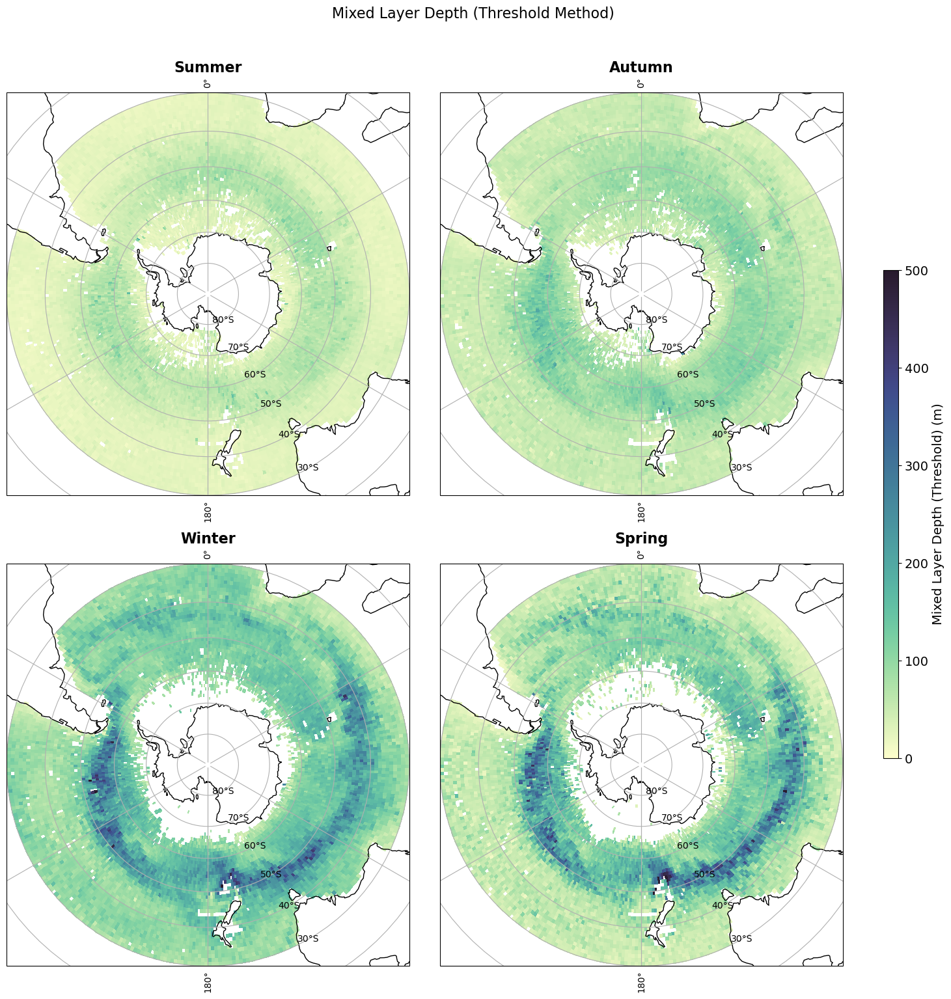

In [743]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15), 
                        subplot_kw={'projection': ccrs.SouthPolarStereo()})
axs = axs.ravel()

for i, season in enumerate(ordered_seasons):
    ds = ds_so_layers_seasonal[season]
    ax = axs[i]
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Plot with consistent color limits
    ds.MLD_threshold.plot(
        ax=ax,
        x='lon_c',
        y='lat_c',
        transform=ccrs.PlateCarree(),
        vmin=0,
        vmax=500,
        cmap=cmo.deep,
        add_colorbar=False
    )
    ax.set_title(season_labels[season])
    
# Colorbar
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
plt.colorbar(axs[0].collections[0], cax=cbar_ax, label="Mixed Layer Depth (Threshold) (m)")

# Title
plt.suptitle("Mixed Layer Depth (Threshold Method)", fontsize=16, y=1.02)

plt.tight_layout(rect=[0, 0, 0.9, 1])


/tmp/ipykernel_60024/2676993461.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


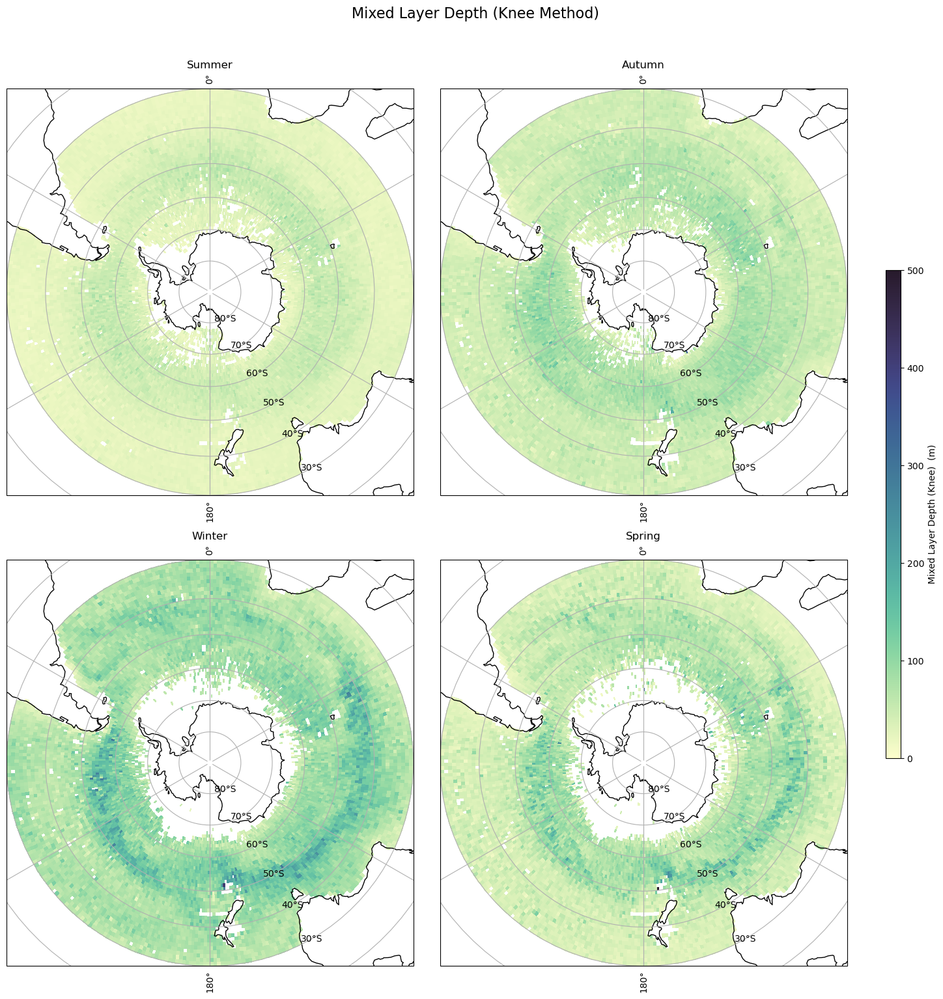

In [199]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15), 
                        subplot_kw={'projection': ccrs.SouthPolarStereo()})
axs = axs.ravel()

for i, season in enumerate(ordered_seasons):
    ds = ds_so_layers_seasonal[season]
    ax = axs[i]
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Plot with consistent color limits
    ds.MLD_knee.plot(
        ax=ax,
        x='lon_c',
        y='lat_c',
        transform=ccrs.PlateCarree(),
        vmin=0,
        vmax=500,
        cmap=cmo.deep,
        add_colorbar=False
    )
    ax.set_title(season_labels[season])
    
# Colorbar
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
plt.colorbar(axs[0].collections[0], cax=cbar_ax, label="Mixed Layer Depth (Knee)  (m)")

# Title
plt.suptitle("Mixed Layer Depth (Knee Method)", fontsize=16, y=1.02)

plt.tight_layout(rect=[0, 0, 0.9, 1])


/tmp/ipykernel_60024/2663914792.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


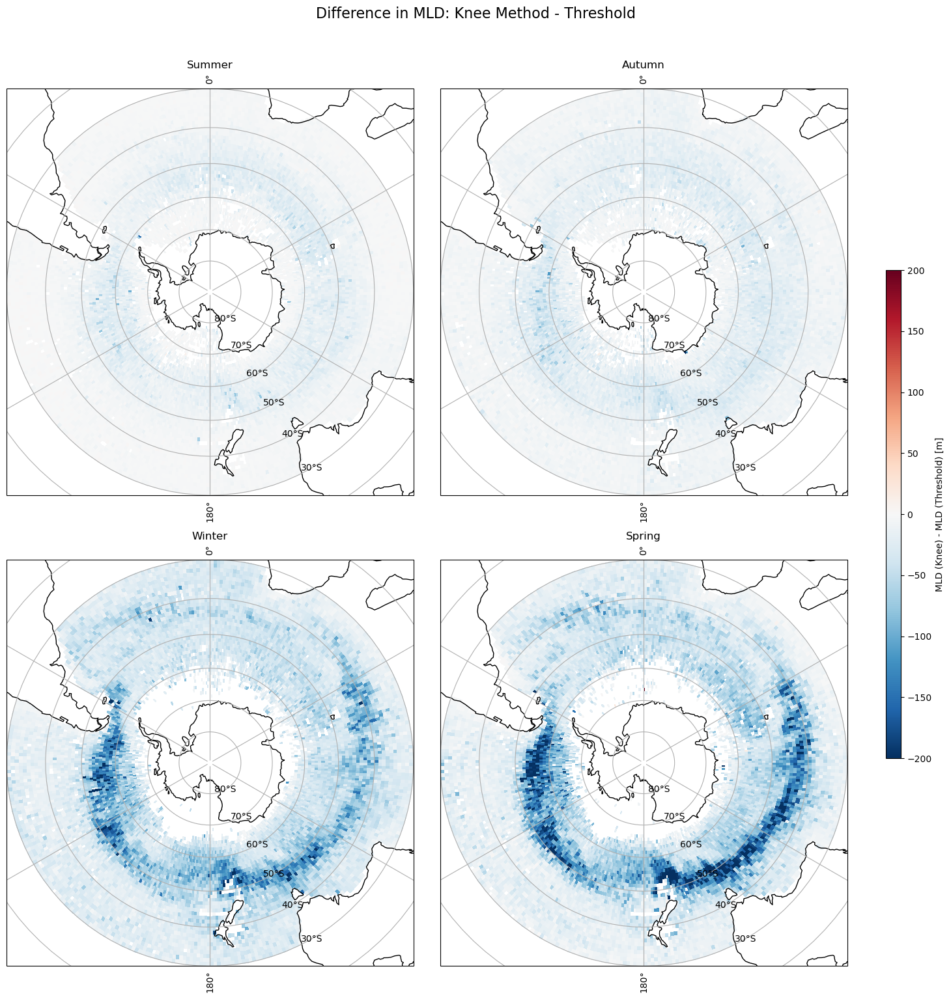

In [212]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15), 
                        subplot_kw={'projection': ccrs.SouthPolarStereo()})
axs = axs.ravel()

for i, season in enumerate(ordered_seasons):
    ds = ds_so_layers_seasonal[season]
    ax = axs[i]
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Compute the difference
    diff = ds.MLD_knee - ds.MLD_threshold

    # Plot with symmetric color limits
    pcm = diff.plot(
        ax=ax,
        x='lon_c',
        y='lat_c',
        transform=ccrs.PlateCarree(),
        vmin=-200, vmax=200,  # Adjust as needed
        cmap='RdBu_r',
        add_colorbar=False
    )
    ax.set_title(season_labels[season])
    
# Colorbar
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
plt.colorbar(pcm, cax=cbar_ax, label="MLD (Knee) - MLD (Threshold) [m]")

# Title
plt.suptitle("Difference in MLD: Knee Method - Threshold", fontsize=16, y=1.02)

plt.tight_layout(rect=[0, 0, 0.9, 1])


/tmp/ipykernel_60024/1318693257.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


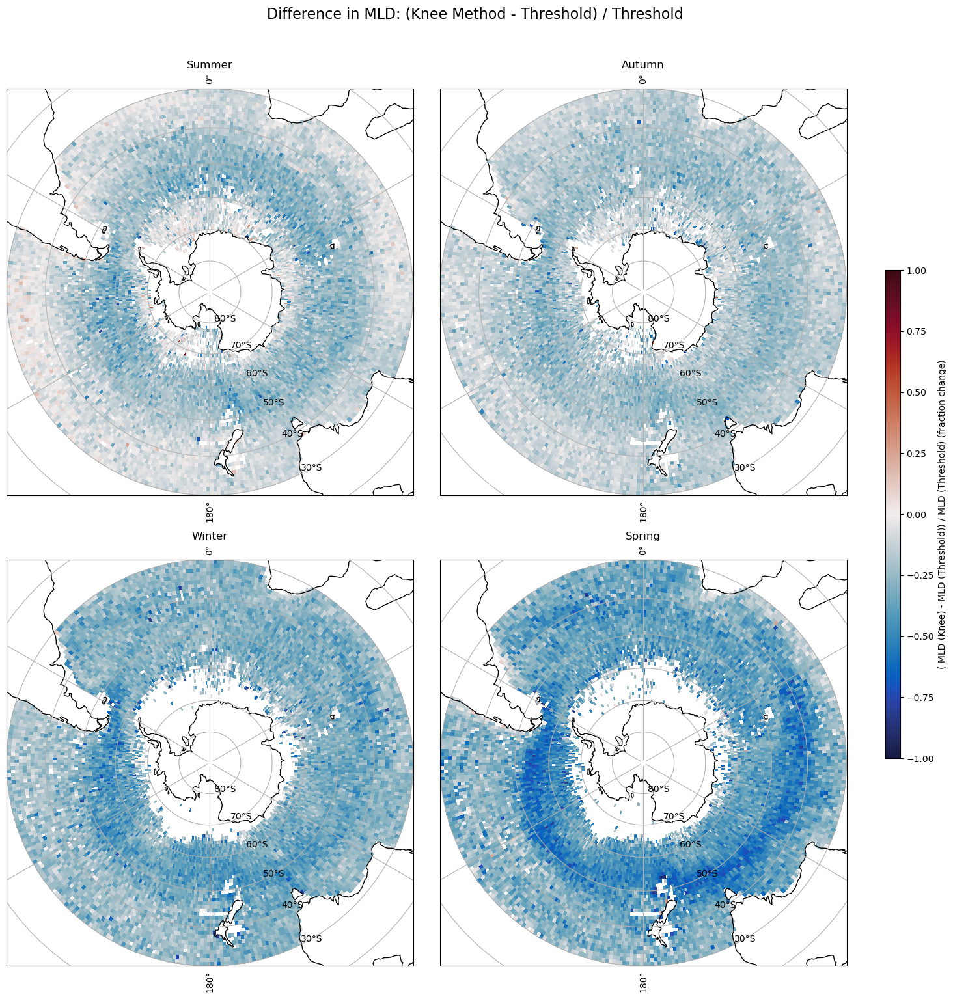

In [332]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15), 
                        subplot_kw={'projection': ccrs.SouthPolarStereo()})
axs = axs.ravel()

for i, season in enumerate(ordered_seasons):
    ds = ds_so_layers_seasonal[season]
    ax = axs[i]
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Compute the difference
    diff = (ds.MLD_knee - ds.MLD_threshold)/(ds.MLD_threshold)

    # Plot with symmetric color limits
    pcm = diff.plot(
        ax=ax,
        x='lon_c',
        y='lat_c',
        transform=ccrs.PlateCarree(),
        vmin=-1, vmax=1,  # Adjust as needed
        cmap=cmo.balance,
        add_colorbar=False
    )
    ax.set_title(season_labels[season])
    
# Colorbar
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
plt.colorbar(pcm, cax=cbar_ax, label="( MLD (Knee) - MLD (Threshold)) / MLD (Threshold) (fraction change)")

# Title
plt.suptitle("Difference in MLD: (Knee Method - Threshold) / Threshold", fontsize=16, y=1.02)

plt.tight_layout(rect=[0, 0, 0.9, 1])


/tmp/ipykernel_60024/1835512927.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


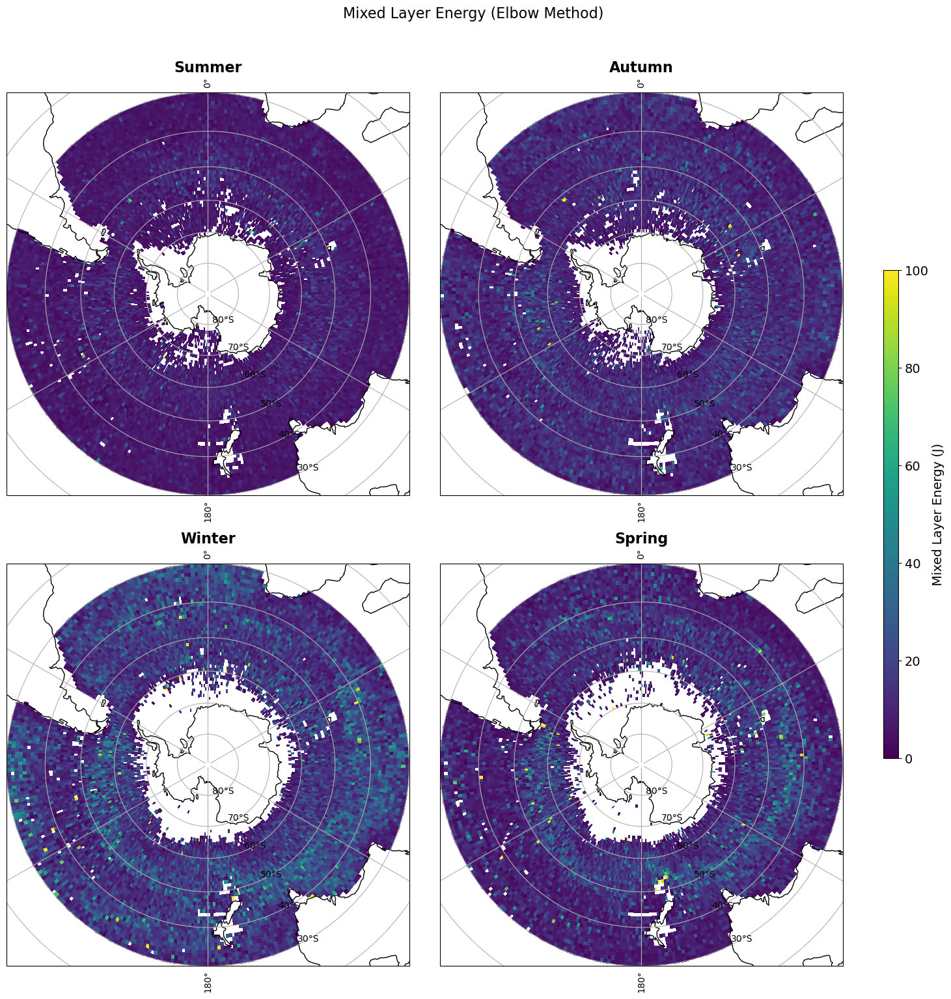

In [754]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15), 
                        subplot_kw={'projection': ccrs.SouthPolarStereo()})
axs = axs.ravel()

for i, season in enumerate(ordered_seasons):
    ds = ds_so_layers_seasonal[season]
    ax = axs[i]
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Plot with consistent color limits
    ds.MLE_knee.plot(
        ax=ax,
        x='lon_c',
        y='lat_c',
        transform=ccrs.PlateCarree(),
        vmin=0,
        vmax=100,
        cmap='viridis',
        add_colorbar=False
    )
    ax.set_title(season_labels[season])

# Colorbar
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
plt.colorbar(axs[0].collections[0], cax=cbar_ax, label="Mixed Layer Energy (J)")

# Title
plt.suptitle("Mixed Layer Energy (Elbow Method)", fontsize=16, y=1.02)

plt.tight_layout(rect=[0, 0, 0.9, 1])


/tmp/ipykernel_60024/2720561426.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


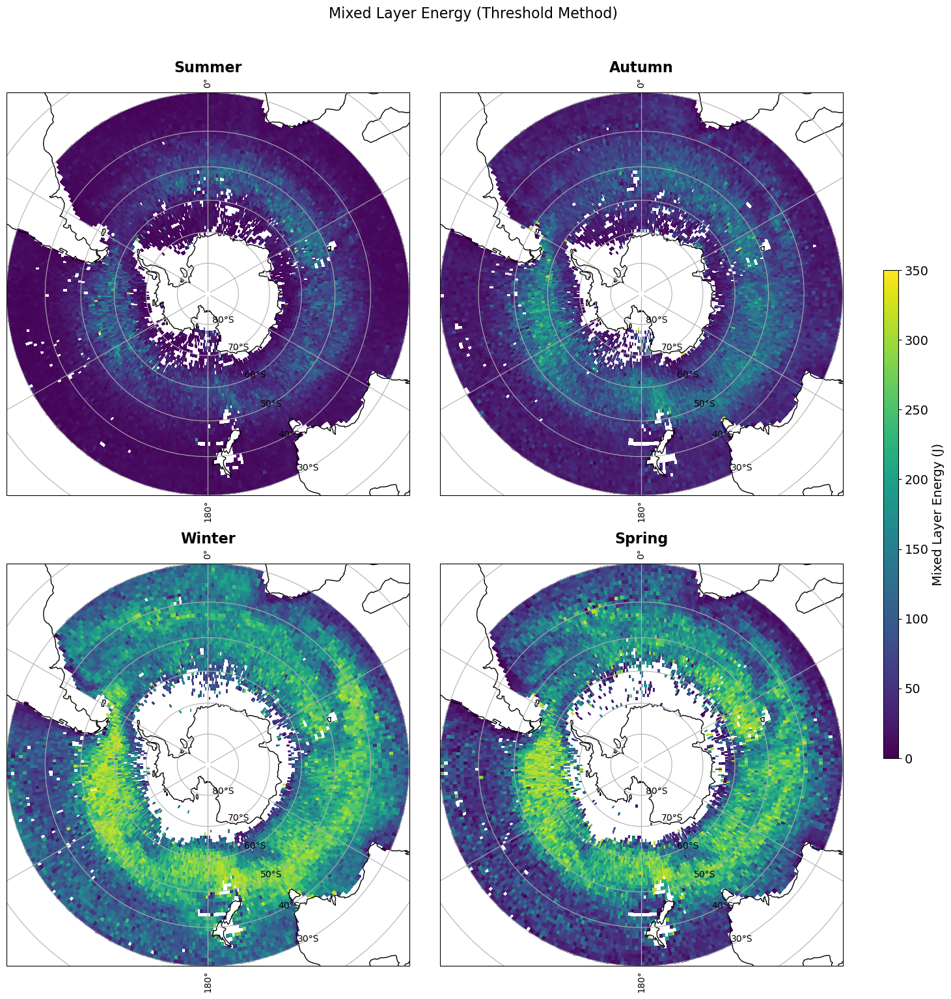

In [752]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15), 
                        subplot_kw={'projection': ccrs.SouthPolarStereo()})
axs = axs.ravel()

for i, season in enumerate(ordered_seasons):
    ds = ds_so_layers_seasonal[season]
    ax = axs[i]
    ax.coastlines()
    ax.gridlines(draw_labels=True)

    # Plot with consistent color limits
    ds.MLE_threshold.plot(
        ax=ax,
        x='lon_c',
        y='lat_c',
        transform=ccrs.PlateCarree(),
        vmin=0,
        vmax=350,
        cmap='viridis',
        add_colorbar=False
    )
    ax.set_title(season_labels[season])

# Colorbar
cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])
plt.colorbar(axs[0].collections[0], cax=cbar_ax, label="Mixed Layer Energy (J)")

# Title
plt.suptitle("Mixed Layer Energy (Threshold Method)", fontsize=16, y=1.02)

plt.tight_layout(rect=[0, 0, 0.9, 1])


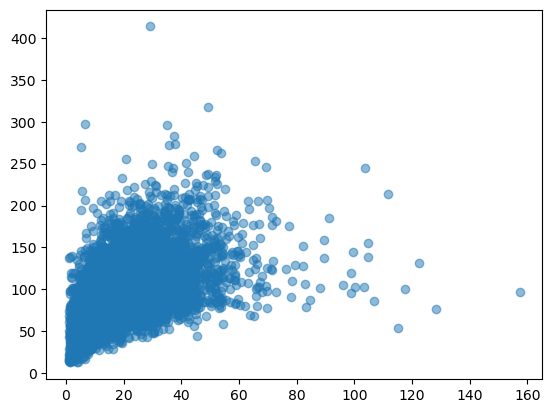

In [320]:
plt.scatter(ds_so_layers_seasonal['JJA']['MLE_knee'], ds_so_layers_seasonal['JJA']['MLD_knee'], alpha = 0.5) 

In [ ]:
plt.scatter(ds_so_layers_seasonal['JJA']['MLE_knee'], ds_so_layers_seasonal['JJA']['MLD_knee'], alpha = 0.5)

In [244]:
ds_final.sel(N_PROF = 983681)

<xarray.Dataset>
Dimensions:            (PRES_INTERPOLATED: 1001)
Coordinates:
  * PRES_INTERPOLATED  (PRES_INTERPOLATED) int64 0 2 4 6 ... 1994 1996 1998 2000
    N_PROF             int64 983681
    TIME               datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
    LATITUDE           float64 dask.array<chunksize=(), meta=np.ndarray>
    LONGITUDE          float64 dask.array<chunksize=(), meta=np.ndarray>
Data variables: (12/15)
    CT                 (PRES_INTERPOLATED) float64 dask.array<chunksize=(1001,), meta=np.ndarray>
    CYCLE_NUMBER       float64 dask.array<chunksize=(), meta=np.ndarray>
    DATA_MODE          object dask.array<chunksize=(), meta=np.ndarray>
    DIRECTION          object dask.array<chunksize=(), meta=np.ndarray>
    PLATFORM_NUMBER    float64 dask.array<chunksize=(), meta=np.ndarray>
    PRES               (PRES_INTERPOLATED) float32 dask.array<chunksize=(1001,), meta=np.ndarray>
    ...                 ...
    TEMP               (PRES_INTERPOLATED) float32 dask.array<chunksize=(1001,), meta=np.ndarray>
    sample_rate        (PRES_INTERPOLATED) float32 dask.array<chunksize=(1001,), meta=np.ndarray>
    SPICE              (PRES_INTERPOLATED) float64 dask.array<chunksize=(1001,), meta=np.ndarray>
    MLD_threshold      float64 dask.array<chunksize=(), meta=np.ndarray>
    MLD_knee           float64 79.9
    MLE_knee           float64 73.91
Attributes:
    DATA_ID:              ARGO
    DOI:                  http://doi.org/10.17882/42182
    Fetched_from:         https://data-argo.ifremer.fr
    Fetched_by:           amf2288
    Fetched_date:         2025/03/11
    Fetched_constraints:  [x=0.00/5.00; y=40.00/45.00; z=0.0/2002.0]
    Fetched_uri:          https://data-argo.ifremer.fr/dac/coriolis/6903068/6...
    Valid uris:           ['https://data-argo.ifremer.fr/dac/coriolis/6903068...
    All uris:             ['https://data-argo.ifremer.fr/dac/coriolis/6903068...
    Processing_history:   [PRES,TEMP,PSAL] real-time and adjusted/delayed var...

----

In [225]:
def get_random_profile(target_lon, target_lat, season=None, ds = ds_final, lon_tol=2, lat_tol=2):
    # Add season coordinate if not present
    if 'season' not in ds.coords:
        ds = ds.assign_coords(season=ds['TIME'].dt.season)
    
    # Filter by season if specified
    if season is not None:
        ds = ds.where(ds.season == season, drop=True)
    
    # Filter by longitude and latitude tolerance box
    nearby = ds.where(
        (np.abs(ds.LONGITUDE - target_lon) < lon_tol) &
        (np.abs(ds.LATITUDE - target_lat) < lat_tol),
        drop=True
    )
    
    n_profiles = nearby.dims.get('N_PROF', 0)
    if n_profiles == 0:
        print("No profiles found near that location (and season).")
        return None
    
    # Randomly select one profile index
    random_idx = np.random.choice(n_profiles)
    prof = nearby.isel(N_PROF=random_idx)
    
    return prof


In [237]:
def prepare_profiles(pres, ct, sa):
    """
    Prepare profiles for energy-based MLD:
    Adds surface extrapolated layer and calculates thickness.

    Works for both:
        - Individual profile (1D arrays)
        - Multiple profiles (2D arrays: shape (N_PROF, N_DEPTH))

    Parameters:
        pres, ct, sa : ndarray
            Pressure, Conservative Temp, Absolute Salinity

    Returns:
        pres_new, dp_new, ct_new, sa_new : ndarray
            Arrays with extrapolated surface layer added (shape: (..., N_DEPTH+1))
    """
    # Handle individual profile (1D)
    if pres.ndim == 1:
        pres = pres[None, :]
        ct   = ct[None, :]
        sa   = sa[None, :]
        squeeze_output = True
    else:
        squeeze_output = False

    N_PROF, N_DEPTH = ct.shape
    pres_2d = np.broadcast_to(pres, (N_PROF, N_DEPTH))

    dp0 = -(pres_2d[:, 0] - 1)
    p0  = -(dp0 / 2)

    dp_rest = np.full((N_PROF, N_DEPTH), -2.0)
    dp_new  = np.concatenate([dp0[:, None], dp_rest], axis=1)

    pres_new = np.concatenate([p0[:, None], pres_2d], axis=1)
    ct_new   = np.concatenate([ct[:, [0]], ct], axis=1)
    sa_new   = np.concatenate([sa[:, [0]], sa], axis=1)

    if squeeze_output:
        return pres_new[0], dp_new[0], ct_new[0], sa_new[0]
    else:
        return pres_new, dp_new, ct_new, sa_new


In [243]:
def prof_mld_from_energy(prof, energy):
    depth_mask = (prof['PRES_INTERPOLATED'] >= 10) & (prof['PRES_INTERPOLATED'] <= 1000)
    prof_new = prof.where(depth_mask, drop = True)
    pres_ex, ct_ex, sa_ex, sig0_ex = prof_new['PRES_INTERPOLATED'].values, prof_new['CT'].values, prof_new['SA'].values, prof_new['SIG0'].values
    pres_new, dp_new, ct_new, sa_new = prepare_profiles(pres_ex, ct_ex, sa_ex)
    
    return oml.mld_delta_pe(pres_new.T, dp_new.T, ct_new.T, sa_new.T, coord= 'pressure', energy = energy)

In [655]:
def plot_profile_with_mld(prof, energy):
    
    mld = prof_mld_from_energy(prof, energy)[0]
    mld_thresh = prof['MLD_threshold'].values
    mld_pea = prof['MLD_knee'].values
    mle_pea = prof['MLE_knee'].values
    
    # Extract and mask
    pres = prof['PRES_INTERPOLATED'].values
    ct = prof['CT'].values
    sa = prof['SA'].values
    sig0 = prof['SIG0'].values

    mask = ~np.isnan(pres) & ~np.isnan(ct) & ~np.isnan(sa) & ~np.isnan(sig0)
    pres, ct, sa, sig0 = pres[mask], ct[mask], sa[mask], sig0[mask]
    mask = pres <= 300
    pres, ct, sa, sig0 = pres[mask], ct[mask], sa[mask], sig0[mask]

    # --- Plot ---
    fig, ax_ct = plt.subplots(figsize=(6, 10))
    ax_ct.invert_yaxis()

    # CT
    ax_ct.plot(ct, pres, color='tab:red')
    ax_ct.set_xlabel("Conservative Temp (°C)", color='tab:red')
    ax_ct.set_ylabel("Pressure (dbar)")
    ax_ct.tick_params(axis='x', labelcolor='tab:red')
    ax_ct.set_yticks(np.arange(0, 1001, 100))
    ax_ct.grid(axis='y', linestyle='--', alpha=0.3)

    # SA
    ax_sa = ax_ct.twiny()
    ax_sa.spines["top"].set_position(("axes", -0.15))
    ax_sa.plot(sa, pres, color='tab:green', zorder = 1)
    ax_sa.set_xlabel("Absolute Salinity (g/kg)", color='tab:green')
    ax_sa.tick_params(axis='x', labelcolor='tab:green')
    ax_sa.xaxis.set_label_position('top')
    ax_sa.xaxis.set_ticks_position('top')
    
    # SIG0
    ax_sig0 = ax_ct.twiny()
    ax_sig0.plot(sig0, pres, color='tab:purple')
    ax_sig0.set_xlabel("Potential Density (kg/m³)", color='tab:purple')
    ax_sig0.tick_params(axis='x', labelcolor='tab:purple')    
    
    ax_sa.axhline(y=mld, linestyle='--', linewidth=1,
                  label=f'Energy MLD: {energy} J ; {mld:.2f} m',
                  color = 'darkgreen')
    ax_sa.axhline(y = mld_pea, linestyle = '--', linewidth = 1,
                 label = f'Energy MLD (Knee): {mle_pea:.2f} J ; {mld_pea:.2f} m',
                 color = 'goldenrod')
    ax_sa.axhline(y = mld_thresh, linestyle = '--', linewidth = 1, color = 'grey',
                  label =f'Thresh MLD: {mld_thresh:.2f} m')
    ax_ct.set_ylim(300, 0)
    leg = ax_sa.legend(loc='upper right', fontsize=10)

    plt.suptitle(
        f'N_PROF: {prof.N_PROF.values.item()} | Lat: {prof.LATITUDE.values:.2f} | '
        f'Lon: {prof.LONGITUDE.values:.2f} | '
        f'Date: {np.datetime_as_string(prof.TIME.values, unit="D")}',
        y=1.02
    )
    plt.tight_layout()
    plt.show()


In [1093]:
def poster_plot_profile_with_mld(prof, energy):
    
    mld = prof_mld_from_energy(prof, energy)[0]
    mld_thresh = prof['MLD_threshold'].values
    mld_pea = prof['MLD_knee'].values
    mle_pea = prof['MLE_knee'].values
    
    # Extract and mask
    pres = prof['PRES_INTERPOLATED'].values
    ct = prof['CT'].values
    sa = prof['SA'].values
    sig0 = prof['SIG0'].values

    mask = ~np.isnan(pres) & ~np.isnan(ct) & ~np.isnan(sa) & ~np.isnan(sig0)
    pres, ct, sa, sig0 = pres[mask], ct[mask], sa[mask], sig0[mask]
    mask = pres <= 1000
    pres, ct, sa, sig0 = pres[mask], ct[mask], sa[mask], sig0[mask]

    # --- Plot ---
    fig, ax_ct = plt.subplots(figsize=(4, 8))
    ax_ct.invert_yaxis()

    # CT
    ax_ct.plot(ct, pres, color='tab:red')
    ax_ct.set_xlabel("Conservative Temp (°C)", color='tab:red')
    ax_ct.set_ylabel("Pressure (dbar)")
    ax_ct.tick_params(axis='x', labelcolor='tab:red')
    ax_ct.set_yticks(np.arange(0, 1001, 100))
    ax_ct.grid(axis='y', linestyle='--', alpha=0.3)

    # SA
    ax_sa = ax_ct.twiny()
    ax_sa.spines["top"].set_position(("axes", -0.20))
    ax_sa.plot(sa, pres, color='tab:green', zorder = 1)
    ax_sa.set_xlabel("Absolute Salinity (g/kg)", color='tab:green')
    ax_sa.tick_params(axis='x', labelcolor='tab:green')
    ax_sa.xaxis.set_label_position('top')
    ax_sa.xaxis.set_ticks_position('top')
    
    # SIG0
    ax_sig0 = ax_ct.twiny()
    ax_sig0.plot(sig0, pres, color='tab:purple')
    ax_sig0.set_xlabel("Potential Density (kg/m³)", color='tab:purple')
    ax_sig0.tick_params(axis='x', labelcolor='tab:purple')    
    
    xmin, xmax = ax_sig0.get_xlim()
    ax_sig0.set_xlim(xmin - 0.02, xmax)
    
#     ax_sa.axhline(y=mld, linestyle='--', linewidth=1,
#                   label=f'Energy MLD: {energy} J ; {mld:.2f} m',
#                   color = 'darkgreen')
    ax_sa.axhline(y = mld_pea, linestyle = '--', linewidth = 1,
                 label = f'Energy MLD (Knee): {mle_pea:.2f} J ; {mld_pea:.2f} m',
                 color = 'goldenrod')
    ax_sa.axhline(y = mld_thresh, linestyle = '--', linewidth = 1, color = 'grey',
                  label =f'Thresh MLD: {mld_thresh:.2f} m')
    ax_ct.set_ylim(1000, 0)
#     leg = ax_sa.legend(loc='upper right', fontsize=10)

    plt.tight_layout()
    plt.show()


In [312]:
prof = get_random_profile(0, -45, season = 'SON')

In [1091]:
prof = ds_final.sel(N_PROF = 1058519)

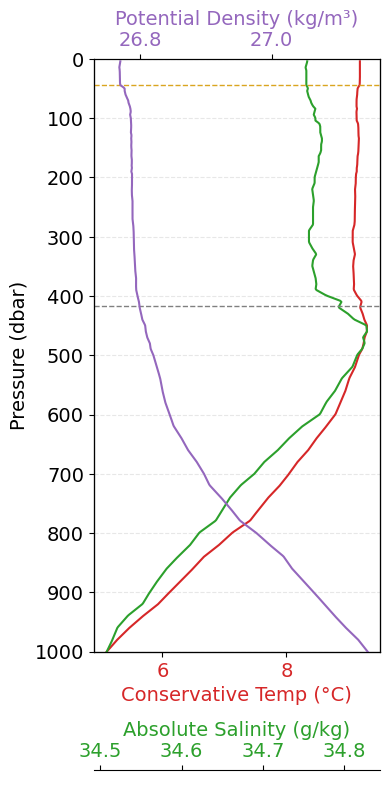

In [1094]:
poster_plot_profile_with_mld(prof, 10)

In [590]:
def mld_from_energies(prof, energies):
    """
    For an array of energies, returns an array of MLDs of the profile
    for those energies
    """
    # Initialize values
    pres = prof['PRES_INTERPOLATED'].values
    ct = prof['CT'].values
    sa = prof['SA'].values
    sig0 = prof['SIG0'].values
    
    # Filter for data below 10 m
    start_i = np.argmax(pres >= 10)
    pres = pres[start_i:]
    ct = ct[start_i:]
    sa = sa[start_i:]
    sig0 = sig0[start_i:]
    
    # Mask out any NaN values
    mask = ~np.isnan(pres) & ~np.isnan(ct) & ~np.isnan(sa) & ~np.isnan(sig0)
    pres, ct, sa, sig0 = pres[mask], ct[mask], sa[mask], sig0[mask]

    # Shallowest layer thickness (negative to match sign convention)
    dp_0 = -(pres[0] - 1)
    # Center of shallowest layer just half of thickness (and positive)
    p_0 = -(dp_0/2)
    
    # Thickness array
    dp = np.array([dp_0] + list(np.full_like(pres, -2.0)))
    # Arrays with extrapolated surface values
    pres = np.array([p_0] + list(pres))
    ct = np.array([ct[0]] + list(ct))
    sa = np.array([sa[0]] + list(sa))
    sig0 = np.array([sig0[0]] + list(sig0))
    # Calculate MLDs
    MLDs = [oml.mld_delta_pe(pres, dp, ct, sa, coord = 'pressure',
                            energy = e).item() for e in energies]
    
    return MLDs

In [629]:
prof = ds_final.sel(N_PROF = 2342324)

In [603]:
prof

<xarray.Dataset>
Dimensions:            (PRES_INTERPOLATED: 1001)
Coordinates:
  * PRES_INTERPOLATED  (PRES_INTERPOLATED) int64 0 2 4 6 ... 1994 1996 1998 2000
    N_PROF             int64 5891
    TIME               datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
    LATITUDE           float64 dask.array<chunksize=(), meta=np.ndarray>
    LONGITUDE          float64 dask.array<chunksize=(), meta=np.ndarray>
Data variables: (12/15)
    CT                 (PRES_INTERPOLATED) float64 dask.array<chunksize=(1001,), meta=np.ndarray>
    CYCLE_NUMBER       float64 dask.array<chunksize=(), meta=np.ndarray>
    DATA_MODE          object dask.array<chunksize=(), meta=np.ndarray>
    DIRECTION          object dask.array<chunksize=(), meta=np.ndarray>
    PLATFORM_NUMBER    float64 dask.array<chunksize=(), meta=np.ndarray>
    PRES               (PRES_INTERPOLATED) float32 dask.array<chunksize=(1001,), meta=np.ndarray>
    ...                 ...
    TEMP               (PRES_INTERPOLATED) float32 dask.array<chunksize=(1001,), meta=np.ndarray>
    sample_rate        (PRES_INTERPOLATED) float32 dask.array<chunksize=(1001,), meta=np.ndarray>
    SPICE              (PRES_INTERPOLATED) float64 dask.array<chunksize=(1001,), meta=np.ndarray>
    MLD_threshold      float64 dask.array<chunksize=(), meta=np.ndarray>
    MLD_knee           float64 119.4
    MLE_knee           float64 166.8
Attributes:
    DATA_ID:              ARGO
    DOI:                  http://doi.org/10.17882/42182
    Fetched_from:         https://data-argo.ifremer.fr
    Fetched_by:           amf2288
    Fetched_date:         2025/03/11
    Fetched_constraints:  [x=0.00/5.00; y=40.00/45.00; z=0.0/2002.0]
    Fetched_uri:          https://data-argo.ifremer.fr/dac/coriolis/6903068/6...
    Valid uris:           ['https://data-argo.ifremer.fr/dac/coriolis/6903068...
    All uris:             ['https://data-argo.ifremer.fr/dac/coriolis/6903068...
    Processing_history:   [PRES,TEMP,PSAL] real-time and adjusted/delayed var...

In [641]:
energies = np.logspace(0, 2.5, 1000)

In [642]:
mld_values = mld_from_energies(prof, energies)

In [ ]:
ds_energy.sel(N_PROF = 2342324)['MLD'].values

In [559]:
energies = np.logspace(0, 2.5, 100)

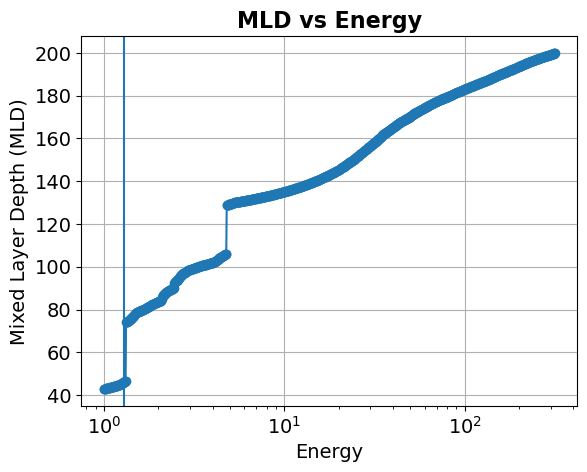

In [665]:
plt.plot(energies, np.array(mld_values), marker='o')
plt.xlabel('Energy' '')
plt.ylabel('Mixed Layer Depth (MLD)')
plt.title('MLD vs Energy')
plt.xscale('log')
plt.axvline(1.3)
# plt.xscale('function', functions=(np.sqrt, lambda x: x**2))

# plt.xscale('log')
plt.grid(True)
plt.show()

----

In [757]:
binned_so = get_ds_binned(ds_final, lon_bins, so_lat_bins)

In [762]:
binned_so

<xarray.Dataset>
Dimensions:            (PRES_INTERPOLATED: 1001, lon_c: 360, lat_c: 60)
Coordinates:
  * PRES_INTERPOLATED  (PRES_INTERPOLATED) int64 0 2 4 6 ... 1994 1996 1998 2000
    LONGITUDE          (lon_c) object (-180, -179] (-179, -178] ... (179, 180]
    LATITUDE           (lat_c) object (-90, -89] (-89, -88] ... (-31, -30]
  * lon_c              (lon_c) float64 -179.5 -178.5 -177.5 ... 178.5 179.5
  * lat_c              (lat_c) float64 -89.5 -88.5 -87.5 ... -32.5 -31.5 -30.5
    lon_l              (lon_c) int64 -180 -179 -178 -177 ... 176 177 178 179
    lon_r              (lon_c) int64 -179 -178 -177 -176 ... 177 178 179 180
    lat_l              (lat_c) int64 -90 -89 -88 -87 -86 ... -35 -34 -33 -32 -31
    lat_r              (lat_c) int64 -89 -88 -87 -86 -85 ... -34 -33 -32 -31 -30
Data variables: (12/16)
    CT                 (PRES_INTERPOLATED, lon_c, lat_c) float64 dask.array<chunksize=(1001, 360, 60), meta=np.ndarray>
    CYCLE_NUMBER       (lon_c, lat_c) float64 dask.array<chunksize=(360, 60), meta=np.ndarray>
    DATA_MODE          (lon_c, lat_c) float64 dask.array<chunksize=(360, 60), meta=np.ndarray>
    DIRECTION          (lon_c, lat_c) float64 dask.array<chunksize=(360, 60), meta=np.ndarray>
    PLATFORM_NUMBER    (lon_c, lat_c) float64 dask.array<chunksize=(360, 60), meta=np.ndarray>
    PRES               (PRES_INTERPOLATED, lon_c, lat_c) float32 dask.array<chunksize=(1001, 360, 60), meta=np.ndarray>
    ...                 ...
    sample_rate        (PRES_INTERPOLATED, lon_c, lat_c) float32 dask.array<chunksize=(1001, 360, 60), meta=np.ndarray>
    SPICE              (PRES_INTERPOLATED, lon_c, lat_c) float64 dask.array<chunksize=(1001, 360, 60), meta=np.ndarray>
    MLD_threshold      (lon_c, lat_c) float64 dask.array<chunksize=(360, 60), meta=np.ndarray>
    MLD_knee           (lon_c, lat_c) float64 dask.array<chunksize=(360, 60), meta=np.ndarray>
    MLE_knee           (lon_c, lat_c) float64 dask.array<chunksize=(360, 60), meta=np.ndarray>
    MLE_threshold      (lon_c, lat_c) float64 dask.array<chunksize=(360, 60), meta=np.ndarray>
Attributes:
    DATA_ID:              ARGO
    DOI:                  http://doi.org/10.17882/42182
    Fetched_from:         https://data-argo.ifremer.fr
    Fetched_by:           amf2288
    Fetched_date:         2025/03/11
    Fetched_constraints:  [x=0.00/5.00; y=40.00/45.00; z=0.0/2002.0]
    Fetched_uri:          https://data-argo.ifremer.fr/dac/coriolis/6903068/6...
    Valid uris:           ['https://data-argo.ifremer.fr/dac/coriolis/6903068...
    All uris:             ['https://data-argo.ifremer.fr/dac/coriolis/6903068...
    Processing_history:   [PRES,TEMP,PSAL] real-time and adjusted/delayed var...

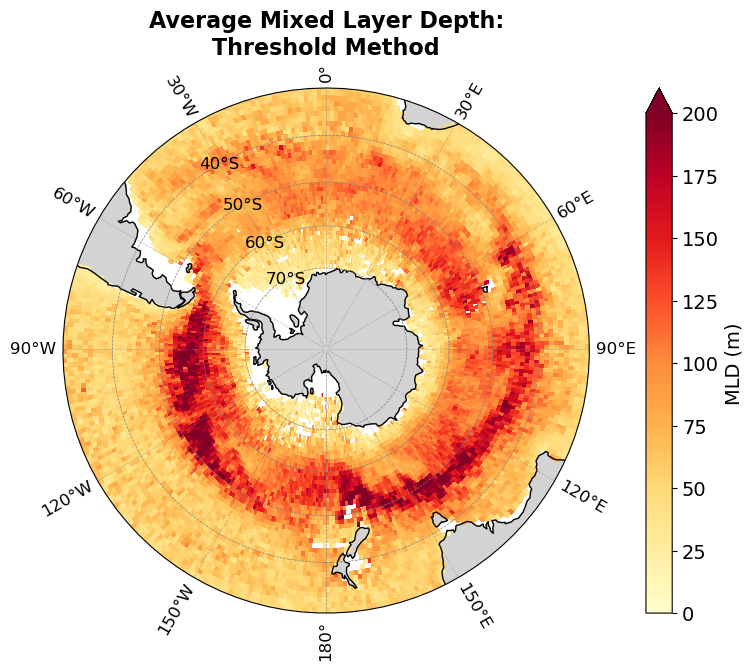

In [1066]:
fig = plt.figure(figsize=(6, 6))
ax = plt.subplot(1, 1, 1, projection=ccrs.SouthPolarStereo())

# === Base map ===
ax.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.LAND, color='lightgray')

# === Gridlines for longitudes only (Cartopy handles these) ===
gl = ax.gridlines(
    draw_labels=True,
    linewidth=0.5,
    color='gray',
    alpha=0.5,
    linestyle='--'
)

gl.xlocator = plt.MultipleLocator(30)
gl.xlabel_style = {'size': 12}
gl.xformatter = LongitudeFormatter(zero_direction_label=False)
gl.ylocator = plt.NullLocator()
# === Plot data ===
binned_so['MLD_threshold'].plot.pcolormesh(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap='YlOrRd',
    vmin=0,
    vmax=200,
    x='lon_c',
    y='lat_c',
    add_colorbar=True,
    cbar_kwargs={'label': 'MLD (m)'}
)

# === Custom latitude circles + labels at 30°W ===
latitudes = np.arange(-70, -39, 10)
for lat in latitudes:
    # Draw latitude ring
    ax.plot(np.linspace(-180, 180, 361), [lat] * 361,
            transform=ccrs.PlateCarree(),
            color='gray', linewidth=0.5, linestyle='--')
    
    # Label at -30° (30°W), shifted slightly inward to avoid boundary clash
    ax.text(
        -30, lat,
        f'{-lat}°S',
        transform=ccrs.PlateCarree(),
        fontsize=12, color = 'black',
        ha='center', va='center',
        clip_on=True
    )

# === Circular map boundary ===
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T * radius + center
circle_path = mpath.Path(verts)
ax.set_boundary(circle_path, transform=ax.transAxes)

# === Title ===
plt.title('Average Mixed Layer Depth:\nThreshold Method')

plt.tight_layout()
fig.subplots_adjust(right=2.0)
plt.show()


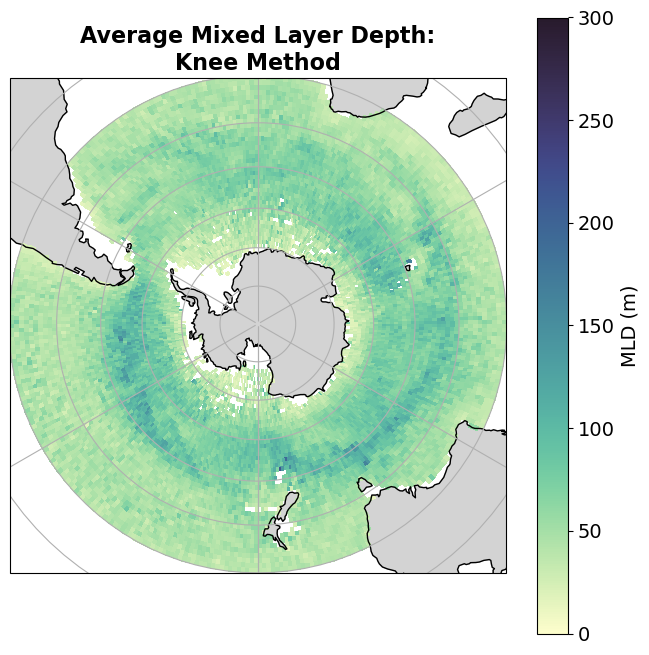

In [796]:


fig = plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection=ccrs.SouthPolarStereo())

# Set the map extent
ax.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.LAND, color='lightgray')
ax.gridlines(draw_labels=False)

# Plot data
p = binned_so['MLD_knee'].plot.pcolormesh(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap=cmo.deep,
    vmin = 0,
    vmax = 300,
    x='lon_c',
    y='lat_c',
    add_colorbar=True,
    cbar_kwargs={'label': 'MLD (m)'}
)

plt.title(f'Average Mixed Layer Depth:\nKnee Method')
plt.show()

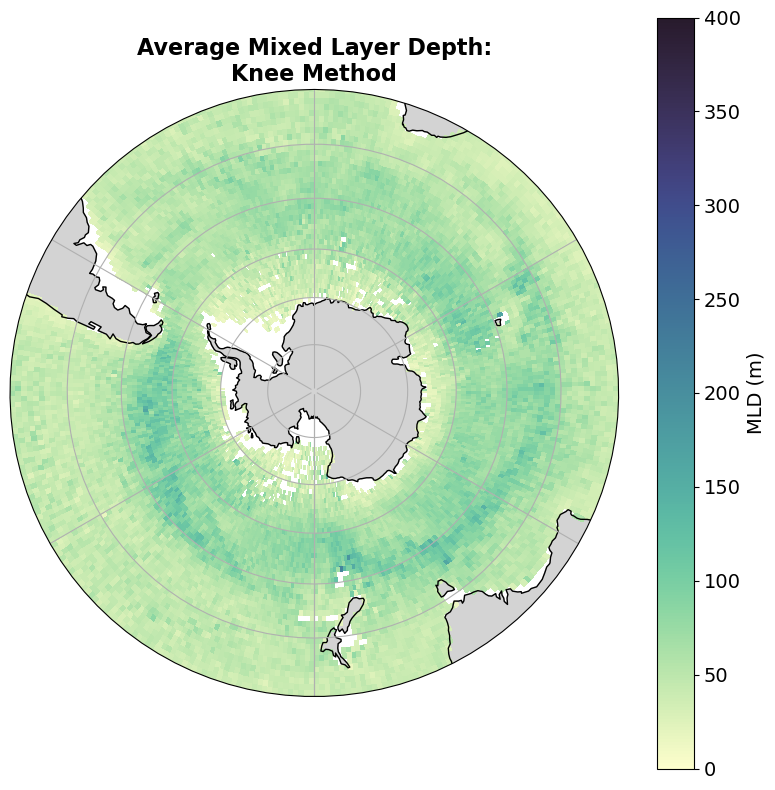

In [787]:
fig = plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection=ccrs.SouthPolarStereo())

# Set map extent and features
ax.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.LAND, color='lightgray')
ax.gridlines(draw_labels=False)

# === Plot data ===
p = binned_so['MLD_knee'].plot.pcolormesh(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap=cmo.deep,
    vmin=0,
    vmax=400,
    x='lon_c',
    y='lat_c',
    add_colorbar=True,
    cbar_kwargs={'label': 'MLD (m)'}
)

# === Apply circular boundary ===
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T * radius + center
circle_path = mpath.Path(verts)
ax.set_boundary(circle_path, transform=ax.transAxes)

# === Title ===
plt.title('Average Mixed Layer Depth:\nKnee Method')

plt.tight_layout()
plt.show()

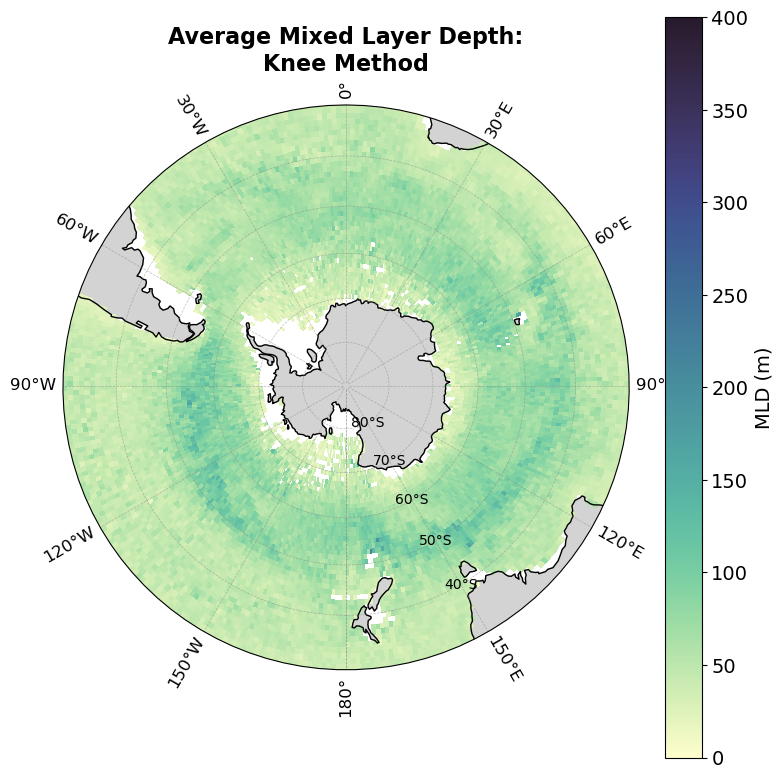

In [908]:
from cartopy.mpl.ticker import LongitudeFormatter

fig = plt.figure(figsize=(8, 8))
ax = plt.subplot(1, 1, 1, projection=ccrs.SouthPolarStereo())

# Set extent and coastlines
ax.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.LAND, color='lightgray')

# === Gridlines with longitude labels ===
gl = ax.gridlines(
    draw_labels=True,
    linewidth=0.5,
    color='gray',
    alpha=0.5,
    linestyle='--'
)

# Customize ticks
gl.xlocator = plt.MultipleLocator(30)
gl.xlabel_style = {'size': 12}
gl.xformatter = LongitudeFormatter(zero_direction_label=False)


# === Plot data ===
binned_so['MLD_knee'].plot.pcolormesh(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap=cmo.deep,
    vmin=0,
    vmax=400,
    x='lon_c',
    y='lat_c',
    add_colorbar=True,
    cbar_kwargs={'label': 'MLD (m)'}
)

# === Circular boundary ===
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T * radius + center
circle_path = mpath.Path(verts)
ax.set_boundary(circle_path, transform=ax.transAxes)

# === Title ===
plt.title('Average Mixed Layer Depth:\nKnee Method')

plt.tight_layout()
plt.show()

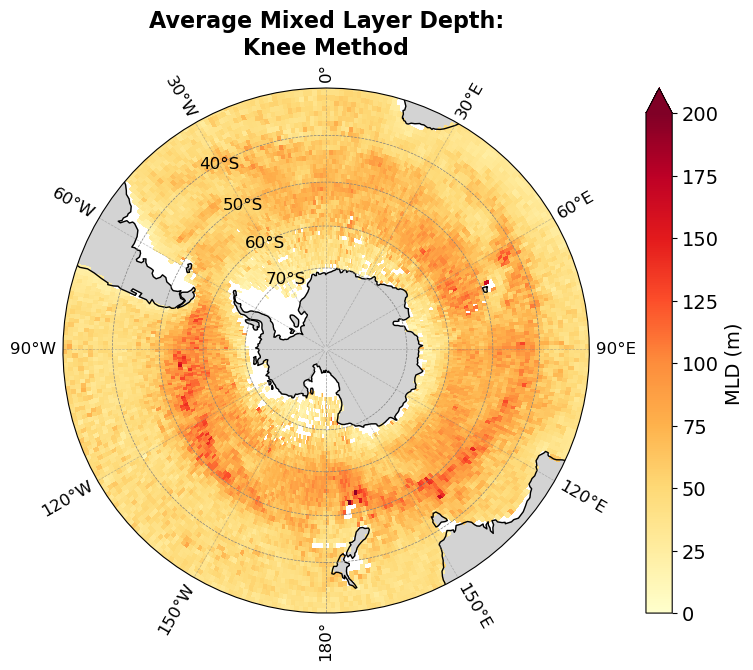

In [1067]:
fig = plt.figure(figsize=(6, 6))
ax = plt.subplot(1, 1, 1, projection=ccrs.SouthPolarStereo())

# === Base map ===
ax.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.LAND, color='lightgray')

# === Gridlines for longitudes only (Cartopy handles these) ===
gl = ax.gridlines(
    draw_labels=True,
    linewidth=0.5,
    color='gray',
    alpha=0.5,
    linestyle='--'
)

gl.xlocator = plt.MultipleLocator(30)
gl.xlabel_style = {'size': 12}
gl.xformatter = LongitudeFormatter(zero_direction_label=False)
gl.ylocator = plt.NullLocator()
# === Plot data ===
binned_so['MLD_knee'].plot.pcolormesh(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap='YlOrRd',
    vmin=0,
    vmax=200,
    x='lon_c',
    y='lat_c',
    add_colorbar=True,
    cbar_kwargs={'label': 'MLD (m)'}
)

# === Custom latitude circles + labels at 30°W ===
latitudes = np.arange(-70, -39, 10)
for lat in latitudes:
    # Draw latitude ring
    ax.plot(np.linspace(-180, 180, 361), [lat] * 361,
            transform=ccrs.PlateCarree(),
            color='gray', linewidth=0.5, linestyle='--')
    
    # Label at -30° (30°W), shifted slightly inward to avoid boundary clash
    ax.text(
        -30, lat,
        f'{-lat}°S',
        transform=ccrs.PlateCarree(),
        fontsize=12, color = 'black',
        ha='center', va='center',
        clip_on=True
    )

# === Circular map boundary ===
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T * radius + center
circle_path = mpath.Path(verts)
ax.set_boundary(circle_path, transform=ax.transAxes)

# === Title ===
plt.title('Average Mixed Layer Depth:\nKnee Method')

plt.tight_layout()
fig.subplots_adjust(right=2.0)
plt.show()


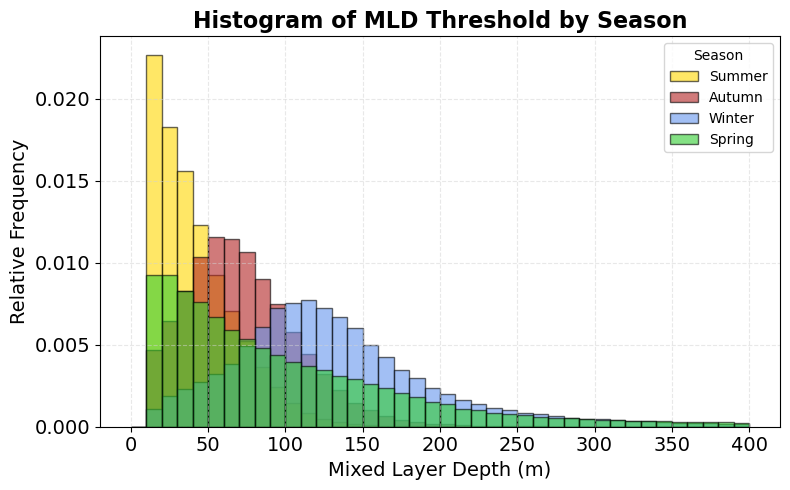

In [999]:
fig, ax = plt.subplots(figsize=(8, 5))

# Optional: define colors for each season
season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

ordered_seasons = ['DJF', 'MAM', 'JJA', 'SON']
seasonal_groups_dict = dict(seasonal_groups)


# Histogram bin edges (you can adjust range/bin width here)
bins = np.arange(0, 400 + 10, 10)

# === Plot histogram for each season ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict.get(season)
    mld = ds_season['MLD_threshold'].values.flatten()
    mld = mld[~np.isnan(mld)]  # remove NaNs

    ax.hist(
        mld,
        bins=bins,
        alpha=0.6,
        density=True,
        label=season_labels.get(season, season),
        color=season_colors.get(season, None),
        edgecolor='k'
    )

# === Labels and legend ===
ax.grid(True, which='both', linestyle='--',color='lightgray', alpha=0.5)
ax.set_xlabel('Mixed Layer Depth (m)')
ax.set_ylabel('Relative Frequency')
ax.set_title('Histogram of MLD Threshold by Season')
ax.legend(title='Season')
plt.tight_layout()
plt.show()

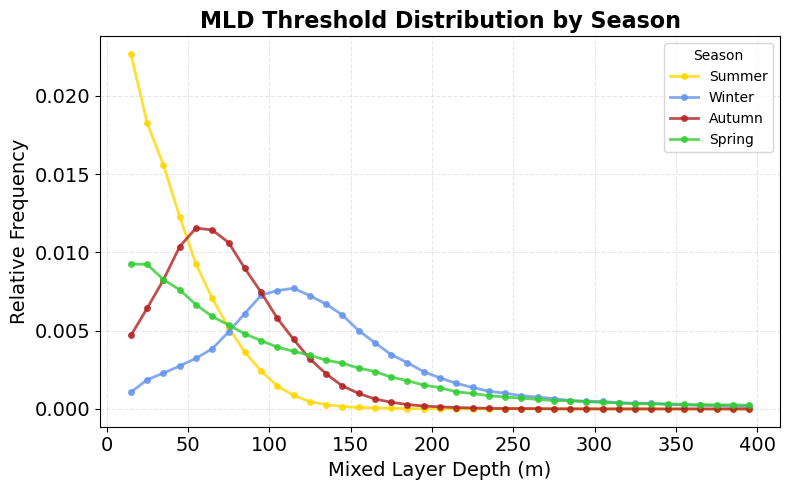

In [1004]:
fig, ax = plt.subplots(figsize=(8, 5))

# Southern Hemisphere season names
season_labels = {
    'DJF': 'Summer',
    'MAM': 'Autumn',
    'JJA': 'Winter',
    'SON': 'Spring'
}

season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

# Define histogram bin edges
bins = np.arange(10, 400 + 10, 10)  # 0–400 in 10m bins
bin_centers = (bins[:-1] + bins[1:]) / 2

# Plot as connected lines with markers
for season, ds_season in seasonal_groups:
    mld = ds_season['MLD_threshold'].values.flatten()
    mld = mld[~np.isnan(mld)]

    counts, _ = np.histogram(mld, bins=bins, density=True)

    ax.plot(
        bin_centers, counts,
        marker='o',
        label=season_labels.get(season, season),
        color=season_colors.get(season, 'gray'),
        linewidth=2,
        markersize=4,
        alpha = 0.8
    )

# === Labels and legend ===
ax.grid(True, which='both', linestyle='--',color='lightgray', alpha=0.5)
ax.set_xlabel('Mixed Layer Depth (m)')
ax.set_ylabel('Relative Frequency')
ax.set_title('MLD Threshold Distribution by Season')
ax.legend(title='Season')
plt.tight_layout()
plt.show()

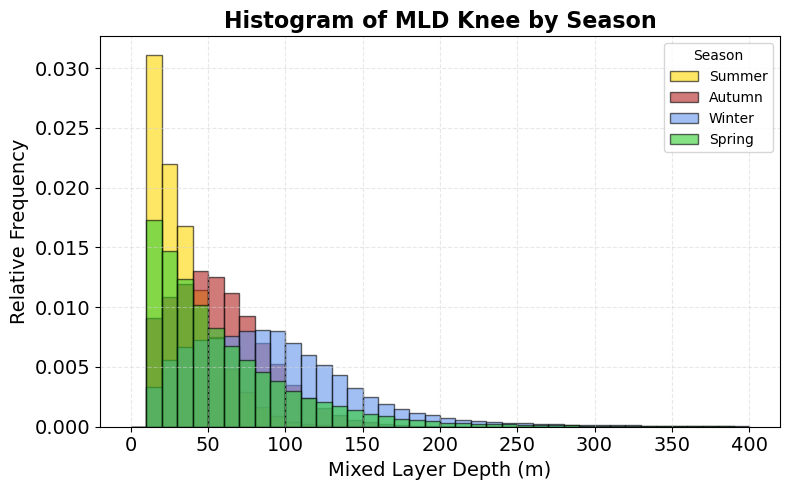

In [1001]:
fig, ax = plt.subplots(figsize=(8, 5))

# Optional: define colors for each season
season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

ordered_seasons = ['DJF', 'MAM', 'JJA', 'SON']
seasonal_groups_dict = dict(seasonal_groups)


# Histogram bin edges (you can adjust range/bin width here)
bins = np.arange(0, 400 + 10, 10)

# === Plot histogram for each season ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict.get(season)
    mld = ds_season['MLD_knee'].values.flatten()
    mld = mld[~np.isnan(mld)]  # remove NaNs

    ax.hist(
        mld,
        bins=bins,
        alpha=0.6,
        density=True,
        label=season_labels.get(season, season),
        color=season_colors.get(season, None),
        edgecolor='k'
    )

# === Labels and legend ===
ax.grid(True, which='both', linestyle='--',color='lightgray', alpha=0.5)
ax.set_xlabel('Mixed Layer Depth (m)')
ax.set_ylabel('Relative Frequency')
ax.set_title('Histogram of MLD Knee by Season')
ax.legend(title='Season')
plt.tight_layout()
plt.show()

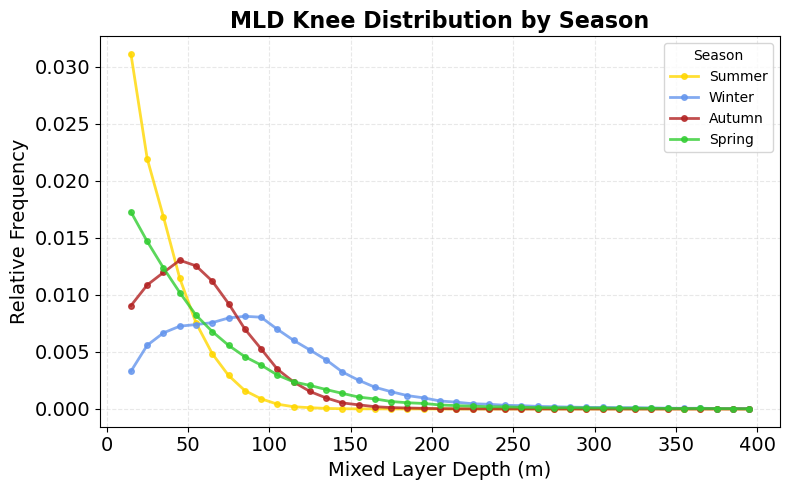

In [1005]:
fig, ax = plt.subplots(figsize=(8, 5))

# Southern Hemisphere season names
season_labels = {
    'DJF': 'Summer',
    'MAM': 'Autumn',
    'JJA': 'Winter',
    'SON': 'Spring'
}

season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

# Define histogram bin edges
bins = np.arange(10, 400 + 10, 10)  # 0–400 in 10m bins
bin_centers = (bins[:-1] + bins[1:]) / 2

# Plot as connected lines with markers
for season, ds_season in seasonal_groups:
    mld = ds_season['MLD_knee'].values.flatten()
    mld = mld[~np.isnan(mld)]

    counts, _ = np.histogram(mld, bins=bins, density=True)

    ax.plot(
        bin_centers, counts,
        marker='o',
        label=season_labels.get(season, season),
        color=season_colors.get(season, 'gray'),
        linewidth=2,
        markersize=4,
        alpha = 0.8
    )

# === Labels and legend ===
ax.grid(True, which='both', linestyle='--',color='lightgray', alpha=0.5)
ax.set_xlabel('Mixed Layer Depth (m)')
ax.set_ylabel('Relative Frequency')
ax.set_title('MLD Knee Distribution by Season')
ax.legend(title='Season')
plt.tight_layout()
plt.show()

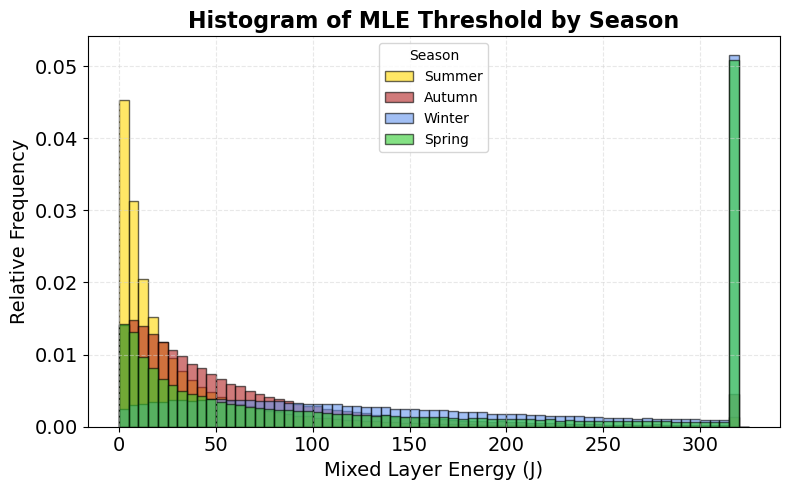

In [1009]:
fig, ax = plt.subplots(figsize=(8, 5))

# Optional: define colors for each season
season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

ordered_seasons = ['DJF', 'MAM', 'JJA', 'SON']
seasonal_groups_dict = dict(seasonal_groups)


# Histogram bin edges (you can adjust range/bin width here)
bins = np.arange(0, 320 + 10, 5)

# === Plot histogram for each season ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict.get(season)
    mle = ds_season['MLE_threshold'].values.flatten()
    mle = mle[~np.isnan(mle)]  # remove NaNs

    ax.hist(
        mle,
        bins=bins,
        alpha=0.6,
        density=True,
        label=season_labels.get(season, season),
        color=season_colors.get(season, None),
        edgecolor='k'
    )

# === Labels and legend ===
ax.grid(True, which='both', linestyle='--',color='lightgray', alpha=0.5)
ax.set_xlabel('Mixed Layer Energy (J)')
ax.set_ylabel('Relative Frequency')
ax.set_title('Histogram of MLE Threshold by Season')
ax.legend(title='Season')
plt.tight_layout()
plt.show()

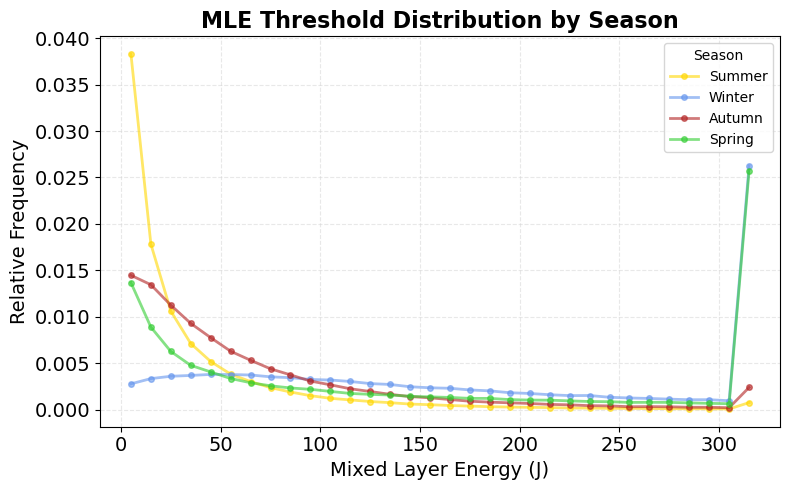

In [1016]:
fig, ax = plt.subplots(figsize=(8, 5))

# Southern Hemisphere season names
season_labels = {
    'DJF': 'Summer',
    'MAM': 'Autumn',
    'JJA': 'Winter',
    'SON': 'Spring'
}

season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

# Define histogram bin edges
bins = np.arange(0, 320 + 10, 10)  # 0–400 in 10m bins
bin_centers = (bins[:-1] + bins[1:]) / 2

# Plot as connected lines with markers
for season, ds_season in seasonal_groups:
    mle = ds_season['MLE_threshold'].values.flatten()
    mle = mle[~np.isnan(mle)]

    counts, _ = np.histogram(mle, bins=bins, density=True)

    ax.plot(
        bin_centers, counts,
        marker='o',
        label=season_labels.get(season, season),
        color=season_colors.get(season, 'gray'),
        linewidth=2,
        markersize=4,
        alpha = 0.6
    )

# === Labels and legend ===
ax.grid(True, which='both', linestyle='--',color='lightgray', alpha=0.5)
ax.set_xlabel('Mixed Layer Energy (J)')
ax.set_ylabel('Relative Frequency')
ax.set_title('MLE Threshold Distribution by Season')
ax.legend(title='Season')
plt.tight_layout()
plt.show()

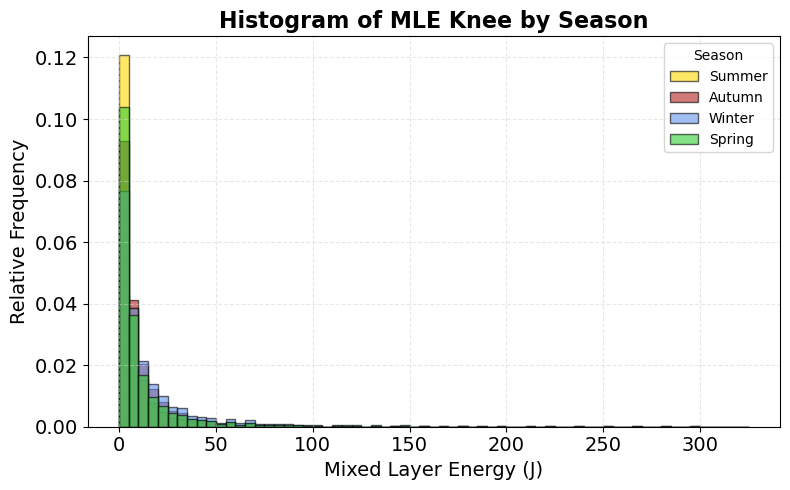

In [1015]:
fig, ax = plt.subplots(figsize=(8, 5))

# Optional: define colors for each season
season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

ordered_seasons = ['DJF', 'MAM', 'JJA', 'SON']
seasonal_groups_dict = dict(seasonal_groups)


# Histogram bin edges (you can adjust range/bin width here)
bins = np.arange(0, 320 + 10, 5)

# === Plot histogram for each season ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict.get(season)
    mle = ds_season['MLE_knee'].values.flatten()
    mle = mle[~np.isnan(mle)]  # remove NaNs

    ax.hist(
        mle,
        bins=bins,
        alpha=0.6,
        density=True,
        label=season_labels.get(season, season),
        color=season_colors.get(season, None),
        edgecolor='k'
    )

# === Labels and legend ===
ax.grid(True, which='both', linestyle='--',color='lightgray', alpha=0.5)
ax.set_xlabel('Mixed Layer Energy (J)')
ax.set_ylabel('Relative Frequency')
ax.set_title('Histogram of MLE Knee by Season')
ax.legend(title='Season')
plt.tight_layout()
plt.show()

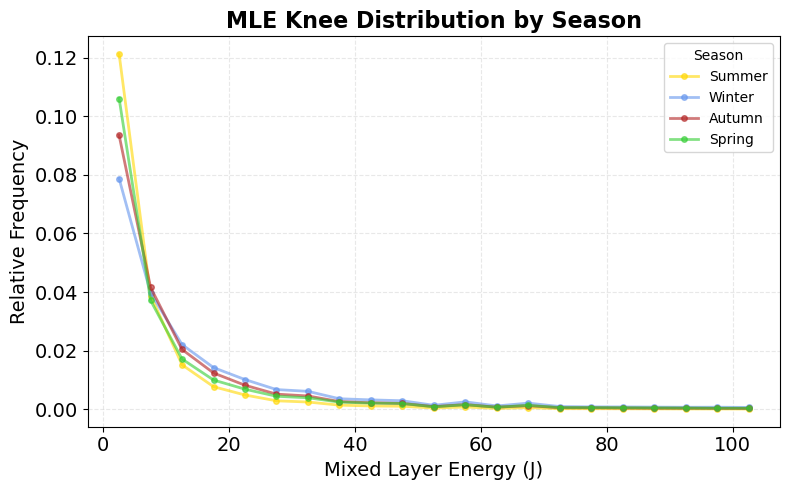

In [1019]:
fig, ax = plt.subplots(figsize=(8, 5))

# Southern Hemisphere season names
season_labels = {
    'DJF': 'Summer',
    'MAM': 'Autumn',
    'JJA': 'Winter',
    'SON': 'Spring'
}

season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

# Define histogram bin edges
bins = np.arange(0, 100 + 10, 5)  # 0–400 in 10m bins
bin_centers = (bins[:-1] + bins[1:]) / 2

# Plot as connected lines with markers
for season, ds_season in seasonal_groups:
    mle = ds_season['MLE_knee'].values.flatten()
    mle = mle[~np.isnan(mle)]

    counts, _ = np.histogram(mle, bins=bins, density=True)

    ax.plot(
        bin_centers, counts,
        marker='o',
        label=season_labels.get(season, season),
        color=season_colors.get(season, 'gray'),
        linewidth=2,
        markersize=4,
        alpha = 0.6
    )

# === Labels and legend ===
ax.grid(True, which='both', linestyle='--',color='lightgray', alpha=0.5)
ax.set_xlabel('Mixed Layer Energy (J)')
ax.set_ylabel('Relative Frequency')
ax.set_title('MLE Knee Distribution by Season')
ax.legend(title='Season')
plt.tight_layout()
plt.show()

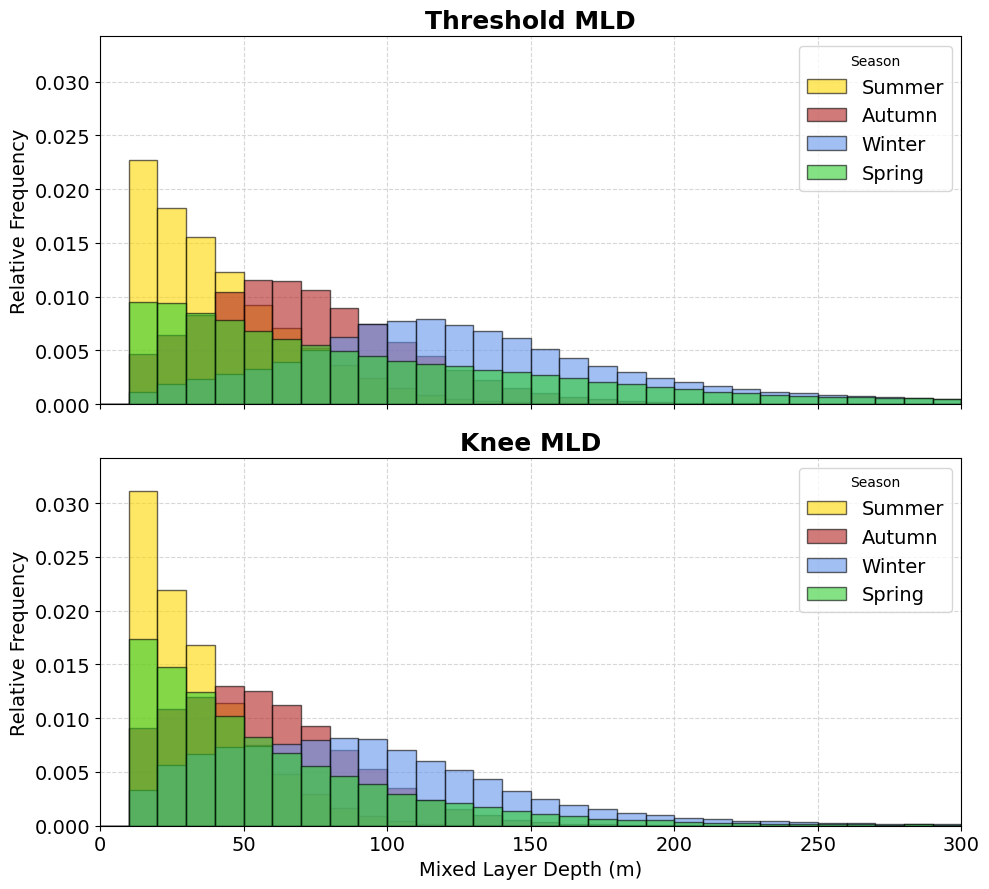

In [1127]:
season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

season_labels = {
    'DJF': 'Summer',
    'MAM': 'Autumn',
    'JJA': 'Winter',
    'SON': 'Spring'
}

ordered_seasons = ['DJF', 'MAM', 'JJA', 'SON']
seasonal_groups_dict = dict(seasonal_groups)

# Shared bins
bins = np.arange(0, 320 + 10, 10)

# === Precompute ymax across both sets ===
def max_density(data_key):
    ymax = 0
    for season in ordered_seasons:
        data = seasonal_groups_dict[season][data_key].values.flatten()
        data = data[~np.isnan(data)]
        counts, _ = np.histogram(data, bins=bins, density=True)
        ymax = max(ymax, counts.max())
    return ymax

ymax_thresh = max_density('MLD_threshold')
ymax_knee   = max_density('MLD_knee')
ymax = max(ymax_thresh, ymax_knee)

# === Set up stacked subplots ===
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 9), sharex=True)

# === First subplot: MLD_threshold ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mld = ds_season['MLD_threshold'].values.flatten()
    mld = mld[~np.isnan(mld)]

    ax1.hist(
        mld, bins=bins, density=True, alpha=0.6,
        label=season_labels[season],
        color=season_colors[season], edgecolor='k'
    )

ax1.set_ylabel('Relative Frequency')
ax1.set_ylim(0, ymax * 1.1)
ax1.set_title('Threshold MLD')
ax1.grid(True, which='both', linestyle='--', color='lightgray', alpha=0.9)
ax1.set_axisbelow(True)
ax1.legend(title='Season', fontsize=14)

# === Second subplot: MLD_knee ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mld = ds_season['MLD_knee'].values.flatten()
    mld = mld[~np.isnan(mld)]

    ax2.hist(
        mld, bins=bins, density=True, alpha=0.6,
        label=season_labels[season],
        color=season_colors[season], edgecolor='k'
    )

ax2.set_xlabel('Mixed Layer Depth (m)')
ax2.set_ylabel('Relative Frequency')
ax2.set_xlim(0, 300)
ax2.set_ylim(0, ymax * 1.1)
ax2.set_title('Knee MLD')
ax2.grid(True, which='both', linestyle='--', color='lightgray', alpha=0.9)
ax2.set_axisbelow(True)
ax2.legend(title='Season', fontsize=14)

plt.tight_layout()
plt.show()

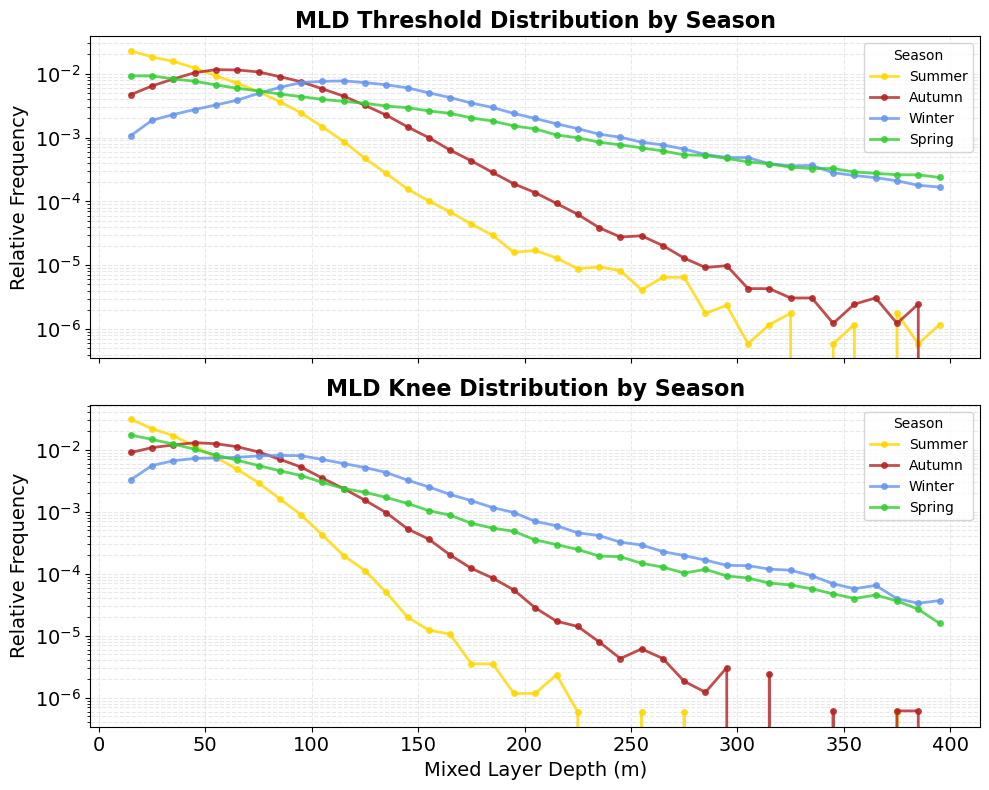

In [1101]:
import matplotlib.pyplot as plt
import numpy as np

# === Season labels and colors ===
season_labels = {
    'DJF': 'Summer',
    'MAM': 'Autumn',
    'JJA': 'Winter',
    'SON': 'Spring'
}

season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

ordered_seasons = ['DJF', 'MAM', 'JJA', 'SON']
seasonal_groups_dict = dict(seasonal_groups)

# === Histogram bin setup ===
bins = np.arange(10, 410, 10)  # from 10 to 400
bin_centers = (bins[:-1] + bins[1:]) / 2

# === Create two stacked subplots with shared x-axis ===
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# === Plot MLD_threshold distributions ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mld = ds_season['MLD_threshold'].values.flatten()
    mld = mld[~np.isnan(mld)]

    counts, _ = np.histogram(mld, bins=bins, density=True)

    ax1.plot(
        bin_centers, counts,
        marker='o',
        label=season_labels[season],
        color=season_colors[season],
        linewidth=2,
        markersize=4,
        alpha=0.8
    )

ax1.set_ylabel('Relative Frequency')
ax1.set_title('MLD Threshold Distribution by Season')
ax1.set_yscale('log')
ax1.grid(True, which='both', linestyle='--', color='lightgray', alpha=0.5)
ax1.legend(title='Season')

# === Plot MLD_knee distributions ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mld = ds_season['MLD_knee'].values.flatten()
    mld = mld[~np.isnan(mld)]

    counts, _ = np.histogram(mld, bins=bins, density=True)

    ax2.plot(
        bin_centers, counts,
        marker='o',
        label=season_labels[season],
        color=season_colors[season],
        linewidth=2,
        markersize=4,
        alpha=0.8
    )

ax2.set_xlabel('Mixed Layer Depth (m)')
ax2.set_ylabel('Relative Frequency')
ax2.set_yscale('log')
ax2.set_title('MLD Knee Distribution by Season')
ax2.grid(True, which='both', linestyle='--', color='lightgray', alpha=0.5)
ax2.legend(title='Season')

plt.tight_layout()
plt.show()


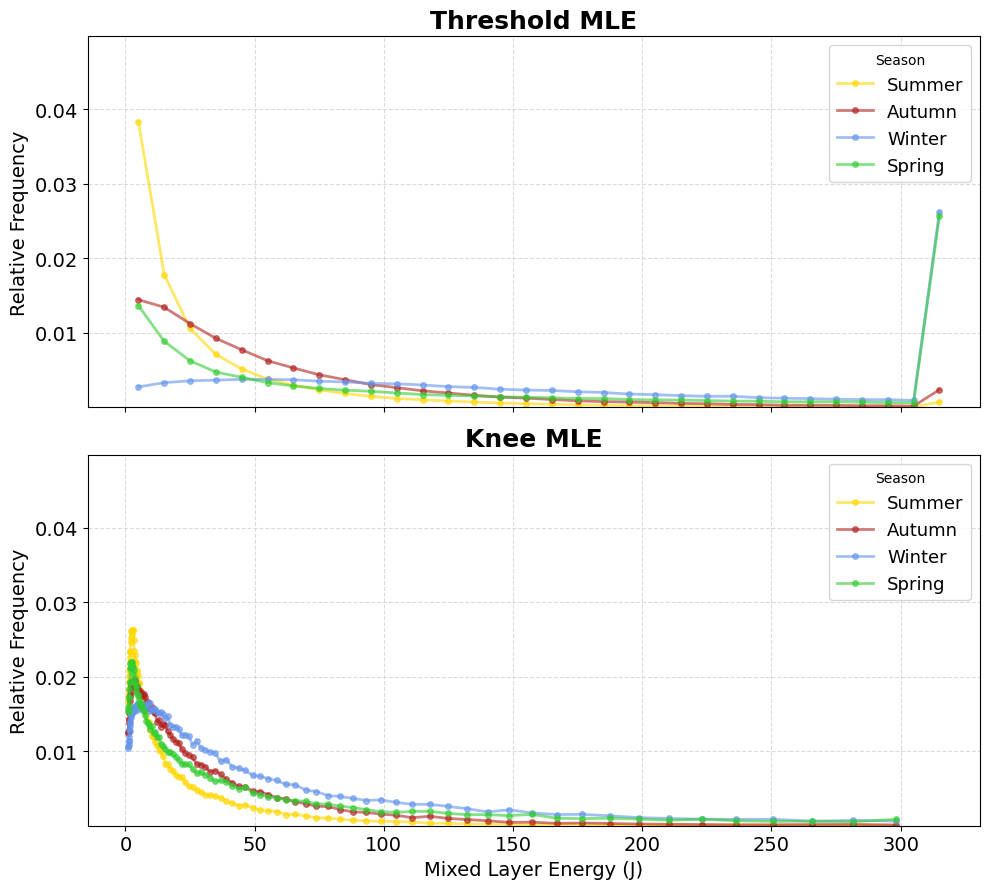

In [1131]:
import numpy as np
import matplotlib.pyplot as plt

# === Season labels and colors ===
season_labels = {
    'DJF': 'Summer',
    'MAM': 'Autumn',
    'JJA': 'Winter',
    'SON': 'Spring'
}

season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

ordered_seasons = ['DJF', 'MAM', 'JJA', 'SON']
seasonal_groups_dict = dict(seasonal_groups)

# === Bin settings for threshold method ===
bins_thresh = np.arange(0, 330, 10)
centers_thresh = (bins_thresh[:-1] + bins_thresh[1:]) / 2

# === Set up subplots ===
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 9), sharex=True)

# === Collect ymax values for shared scaling ===
ymax_thresh = 0
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mle = ds_season['MLE_threshold'].values.flatten()
    mle = mle[~np.isnan(mle)]
    counts, _ = np.histogram(mle, bins=bins_thresh, density=True)
    ymax_thresh = max(ymax_thresh, counts.max())

ymax_knee = 0
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mle = ds_season['MLE_knee'].values.flatten()
    mle = mle[~np.isnan(mle)]
    unique_vals, counts = np.unique(mle, return_counts=True)
    rel_freq = counts / counts.sum()
    ymax_knee = max(ymax_knee, rel_freq.max())

ymax = max(ymax_thresh, ymax_knee)

# === Plot MLE_threshold (binned) ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mle = ds_season['MLE_threshold'].values.flatten()
    mle = mle[~np.isnan(mle)]

    counts, _ = np.histogram(mle, bins=bins_thresh, density=True)

    ax1.plot(
        centers_thresh, counts,
        marker='o',
        label=season_labels[season],
        color=season_colors[season],
        linewidth=2,
        markersize=4,
        alpha=0.6
    )

ax1.set_ylabel('Relative Frequency')
ax1.set_ylim(1e-5, ymax * 1.3)
ax1.set_title('Threshold MLE')
ax1.grid(True, which='both', linestyle='--', color='lightgray', alpha=0.8)
ax1.set_axisbelow(True)
ax1.legend(title='Season', fontsize=13)

# === Plot MLE_knee (discrete counts) ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mle = ds_season['MLE_knee'].values.flatten()
    mle = mle[~np.isnan(mle)]

    unique_vals, counts = np.unique(mle, return_counts=True)
    rel_freq = counts / counts.sum()

    ax2.plot(
        unique_vals, rel_freq,
        marker='o',
        label=season_labels[season],
        color=season_colors[season],
        linewidth=2,
        markersize=4,
        alpha=0.6
    )

ax2.set_xlabel('Mixed Layer Energy (J)')
ax2.set_ylabel('Relative Frequency')
ax2.set_ylim(1e-5, ymax * 1.3)
ax2.set_title('Knee MLE')
ax2.grid(True, which='both', linestyle='--', color='lightgray', alpha=0.8)
ax2.set_axisbelow(True)
ax2.legend(title='Season', fontsize=13)

plt.tight_layout()
plt.show()


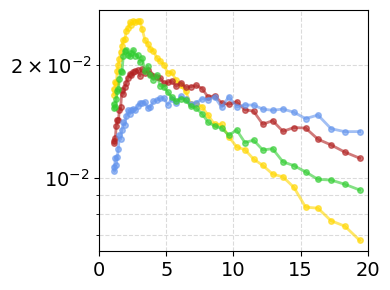

In [1120]:
import matplotlib.pyplot as plt
import numpy as np

season_colors = {
    'DJF': 'gold',
    'MAM': 'firebrick',
    'JJA': 'cornflowerblue',
    'SON': 'limegreen'
}

ordered_seasons = ['DJF', 'MAM', 'JJA', 'SON']
seasonal_groups_dict = dict(seasonal_groups)

# === Set up figure ===
fig, ax = plt.subplots(figsize=(4, 3))

# === Plot MLE_knee for zoomed range ===
for season in ordered_seasons:
    ds_season = seasonal_groups_dict[season]
    mle = ds_season['MLE_knee'].values.flatten()
    mle = mle[~np.isnan(mle)]

    unique_vals, counts = np.unique(mle, return_counts=True)
    rel_freq = counts / counts.sum()

    # Select only the values in range 0–20
    mask = (unique_vals >= 0) & (unique_vals <= 20)
    ax.plot(
        unique_vals[mask], rel_freq[mask],
        marker='o',
        color=season_colors[season],
        linewidth=2,
        markersize=4,
        alpha=0.6
    )

# === Format ===
ax.set_xlim(0, 20)
ax.set_yscale('log')
ax.grid(True, which='both', linestyle='--', color='lightgray', alpha=0.8)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()


In [1037]:
prof = ds_energy.sel(N_PROF = 415872)

In [1045]:
ds_final.sel(N_PROF = 415872)['MLD_knee']

<xarray.DataArray 'MLD_knee' ()>
array(143.54974011)
Coordinates:
    N_PROF     int64 415872
    TIME       datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
    LATITUDE   float64 dask.array<chunksize=(), meta=np.ndarray>
    LONGITUDE  float64 dask.array<chunksize=(), meta=np.ndarray>

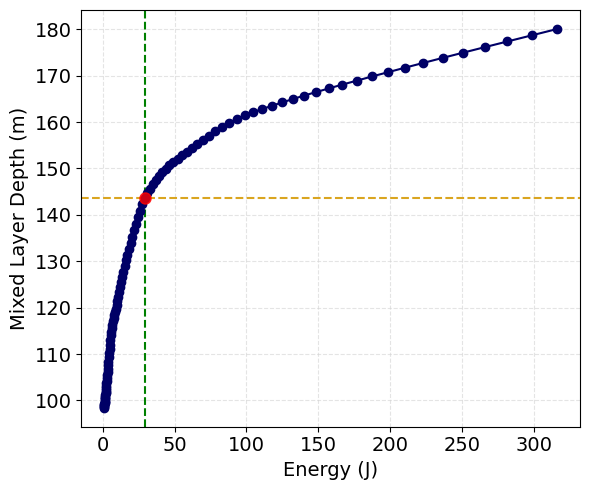

In [1064]:
energy = prof['energy'].values
mld = prof['MLD'].values
target_energy = ds_final.sel(N_PROF=415872)['MLE_knee'].values

# --- Find index of closest energy value ---
i_closest = np.argmin(np.abs(energy - target_energy))
closest_energy = energy[i_closest]
closest_mld = mld[i_closest]

# --- Plot ---
plt.figure(figsize=(6, 5))

plt.axhline(ds_final.sel(N_PROF=415872)['MLD_knee'], linestyle='--', color='goldenrod', label='MLD_knee')
plt.axvline(target_energy, linestyle='--', color='green')

# All points
plt.plot(energy, mld, marker='o', linestyle='-', color='#000066')

# Highlight nearest point
plt.plot(closest_energy, closest_mld, 'o', markersize=8, color='red', alpha = 0.8)

plt.xlabel('Energy (J)')
plt.ylabel('Mixed Layer Depth (m)')
plt.grid(True, linestyle='--', color='lightgray', alpha=0.6)
plt.tight_layout()
plt.show()

/tmp/ipykernel_60024/2307064953.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


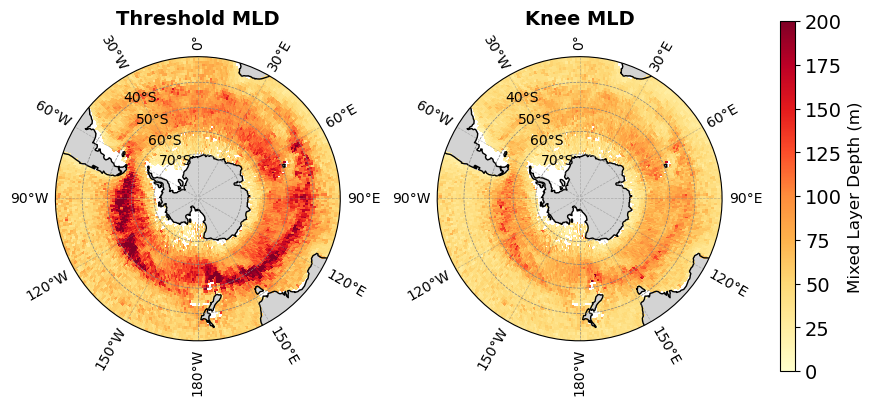

In [1125]:
from matplotlib.ticker import MultipleLocator
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER

# === Prepare shared color scale ===
vmin = 0
vmax = 200

fig = plt.figure(figsize=(10, 5))
gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.04], wspace=0.5)

cmap_c = 'YlOrRd'

# ---- THRESHOLD METHOD PLOT ----
ax1 = fig.add_subplot(gs[0], projection=ccrs.SouthPolarStereo())
ax1.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax1.coastlines()
ax1.add_feature(cfeature.LAND, color='lightgray')

gl1 = ax1.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl1.xlocator = MultipleLocator(30)
gl1.xformatter = LONGITUDE_FORMATTER
gl1.xlabel_style = {'size': 10}
gl1.ylocator = plt.NullLocator()

p1 = binned_so['MLD_threshold'].plot.pcolormesh(
    ax=ax1,
    transform=ccrs.PlateCarree(),
    cmap=cmap_c,
    vmin=vmin,
    vmax=vmax,
    x='lon_c',
    y='lat_c',
    add_colorbar=False
)

for lat in np.arange(-70, -39, 10):
    ax1.plot(np.linspace(-180, 180, 361), [lat] * 361, transform=ccrs.PlateCarree(),
             color='gray', linewidth=0.5, linestyle='--')
    ax1.text(-30, lat, f'{-lat}°S', transform=ccrs.PlateCarree(),
             fontsize=10, ha='center', va='center')

# Circle boundary
theta = np.linspace(0, 2*np.pi, 100)
circle = np.vstack([np.sin(theta), np.cos(theta)]).T * 0.5 + 0.5
ax1.set_boundary(mpath.Path(circle), transform=ax1.transAxes)
ax1.set_title('Threshold MLD', fontsize=14)

# ---- KNEE METHOD PLOT ----
ax2 = fig.add_subplot(gs[1], projection=ccrs.SouthPolarStereo())
ax2.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax2.coastlines()
ax2.add_feature(cfeature.LAND, color='lightgray')

gl2 = ax2.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl2.xlocator = MultipleLocator(30)
gl2.xformatter = LONGITUDE_FORMATTER
gl2.xlabel_style = {'size': 10}
gl2.ylocator = plt.NullLocator()

p2 = binned_so['MLD_knee'].plot.pcolormesh(
    ax=ax2,
    transform=ccrs.PlateCarree(),
    cmap=cmap_c,
    vmin=vmin,
    vmax=vmax,
    x='lon_c',
    y='lat_c',
    add_colorbar=False
)

for lat in np.arange(-70, -39, 10):
    ax2.plot(np.linspace(-180, 180, 361), [lat] * 361, transform=ccrs.PlateCarree(),
             color='gray', linewidth=0.5, linestyle='--')
    ax2.text(-30, lat, f'{-lat}°S', transform=ccrs.PlateCarree(),
             fontsize=10, ha='center', va='center')

# Circle boundary
ax2.set_boundary(mpath.Path(circle), transform=ax2.transAxes)
ax2.set_title('Knee MLD', fontsize=14)

# ---- Shared colorbar ----
cax = fig.add_axes([0.85, 0.15, 0.015, 0.7])
cbar = fig.colorbar(p2, cax=cax)
cbar.set_label('Mixed Layer Depth (m)', fontsize=12)

plt.tight_layout()
plt.show()